In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import glob
from matplotlib.colors import Normalize
from skimage.feature import canny
from skimage.transform import hough_line, hough_line_peaks


# Assigned ranges for analysis
range1=("092022", "092212")
range2=("091122", "091312")
range3=("090302", "090452")


In [2]:
def get_range(ts_start: str, ts_end: str, dx=5.1065, dt=0.0016):
    files = glob.glob("../data/*.npy")
    files.sort()
    
    def extract_ts(path):
        fname = path.split("\\")[-1].split("/")[-1].split(".")[0]
        return datetime.datetime.strptime("2024-05-07 " + fname, "%Y-%m-%d %H%M%S")
    
    ts_start_dt = datetime.datetime.strptime("2024-05-07 " + ts_start, "%Y-%m-%d %H%M%S")
    ts_end_dt = datetime.datetime.strptime("2024-05-07 " + ts_end, "%Y-%m-%d %H%M%S")
    
    selected = []
    timestamps = []
    for f in files:
        ts = extract_ts(f)
        if ts_start_dt <= ts <= ts_end_dt:
            selected.append(f)
            timestamps.append(ts)
    
    if not selected:
        raise ValueError("No files found between the given timestamps.")
    
    arrays = [np.load(f) for f in selected]
    data = np.concatenate(arrays)
    
    index = pd.date_range(start=timestamps[0], periods=len(data), freq=f"{dt}s")
    columns = np.arange(data.shape[1]) * dx
    df = pd.DataFrame(data=data, index=index, columns=columns)
    
    return {"data": data, "df": df, "dt": dt, "dx": dx}

Kształt danych: (75000, 52)
Czas próbkowania: 0.0016 s
Częstotliwość próbkowania: 625.0 Hz
Rozdzielczość przestrzenna: 5.1065 m


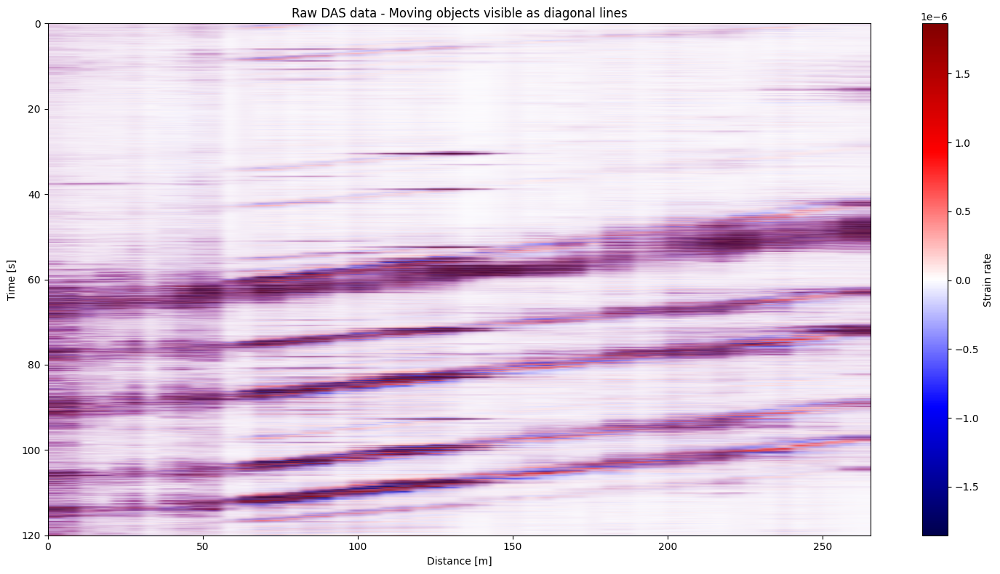

In [3]:
# Wczytanie danych dla pierwszego zakresu
data_dict = get_range(range1[0], range1[1])
data = data_dict['data']
dt = data_dict['dt']
dx = data_dict['dx']

print(f"Kształt danych: {data.shape}")
print(f"Czas próbkowania: {dt} s")
print(f"Częstotliwość próbkowania: {1/dt} Hz")
print(f"Rozdzielczość przestrzenna: {dx} m")

# Wizualizacja surowych danych
plt.figure(figsize=(15, 8))
plt.imshow(data, aspect='auto', cmap='seismic', 
           extent=[0, data.shape[1]*dx, data.shape[0]*dt, 0],
           vmin=np.percentile(data, 1), vmax=np.percentile(data, 99))
plt.colorbar(label='Strain rate')
plt.xlabel('Distance [m]')
plt.ylabel('Time [s]')
plt.title('Raw DAS data - Moving objects visible as diagonal lines')
plt.tight_layout()
plt.show()

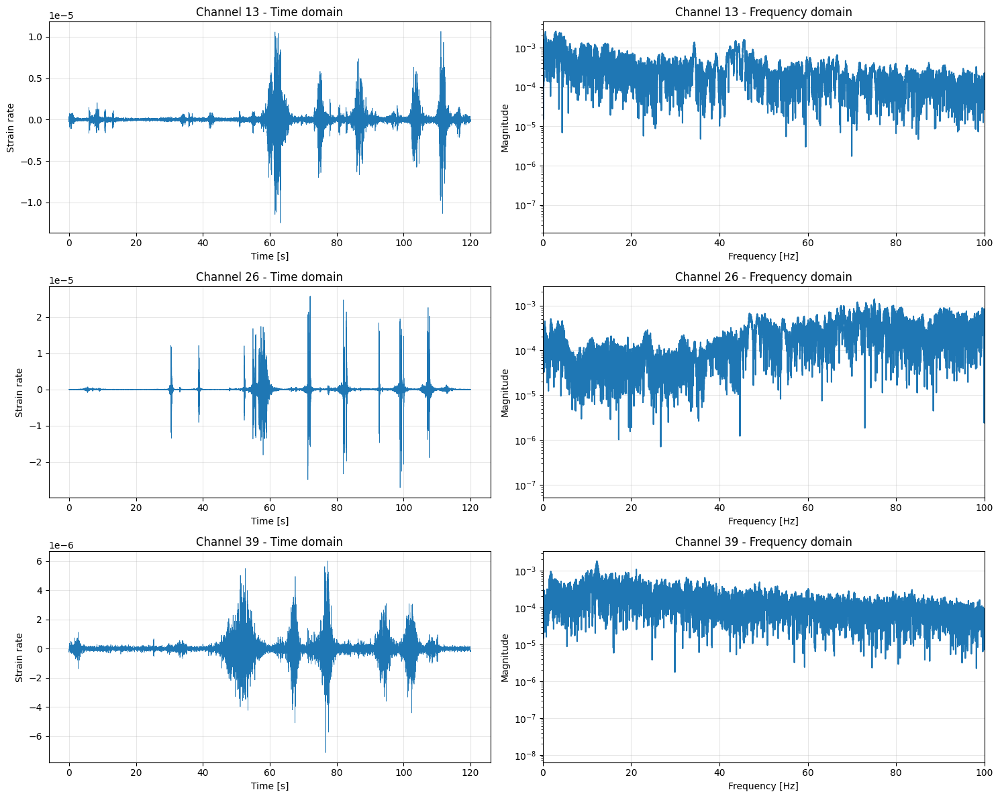

In [4]:
# Analiza FFT dla kilku reprezentatywnych kanałów
fs = 1/dt  # częstotliwość próbkowania
n_channels = data.shape[1]
middle_channel = n_channels // 2

# Wybierzmy kilka kanałów do analizy
channels_to_analyze = [n_channels//4, middle_channel, 3*n_channels//4]

fig, axes = plt.subplots(len(channels_to_analyze), 2, figsize=(15, 12))

for idx, ch in enumerate(channels_to_analyze):
    signal = data[:, ch]
    
    # Sygnał w dziedzinie czasu
    time = np.arange(len(signal)) * dt
    axes[idx, 0].plot(time, signal, linewidth=0.5)
    axes[idx, 0].set_xlabel('Time [s]')
    axes[idx, 0].set_ylabel('Strain rate')
    axes[idx, 0].set_title(f'Channel {ch} - Time domain')
    axes[idx, 0].grid(True, alpha=0.3)
    
    # FFT
    fft_vals = np.fft.rfft(signal)
    fft_freq = np.fft.rfftfreq(len(signal), dt)
    fft_mag = np.abs(fft_vals)
    
    axes[idx, 1].semilogy(fft_freq, fft_mag)
    axes[idx, 1].set_xlabel('Frequency [Hz]')
    axes[idx, 1].set_ylabel('Magnitude')
    axes[idx, 1].set_title(f'Channel {ch} - Frequency domain')
    axes[idx, 1].grid(True, alpha=0.3)
    axes[idx, 1].set_xlim([0, 100])  # Fokus na niższych częstotliwościach

plt.tight_layout()
plt.show()

Obliczanie FFT dla wszystkich kanałów...
Processing channel 0/52


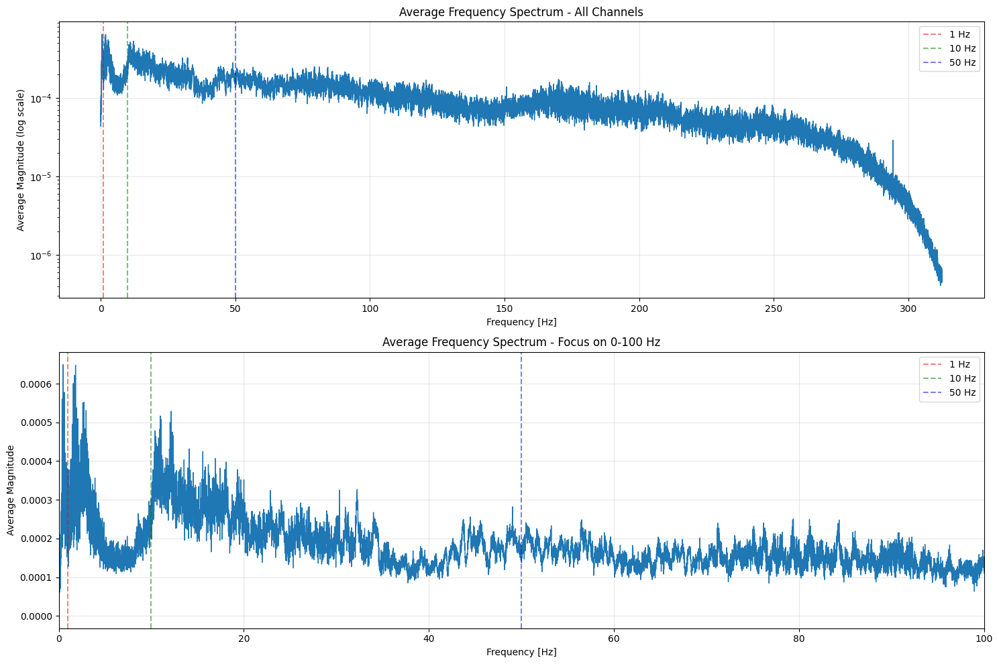


Częstotliwość Nyquista: 312.50 Hz

Największe składowe częstotliwości:
  0.48 Hz: magnitude = 6.50e-04
  1.82 Hz: magnitude = 6.48e-04
  1.70 Hz: magnitude = 6.21e-04
  1.57 Hz: magnitude = 6.01e-04
  1.69 Hz: magnitude = 6.00e-04
  0.60 Hz: magnitude = 5.78e-04
  0.37 Hz: magnitude = 5.60e-04
  0.53 Hz: magnitude = 5.54e-04
  1.81 Hz: magnitude = 5.53e-04
  2.73 Hz: magnitude = 5.53e-04


In [5]:
# Obliczenie średniego widma mocy dla wszystkich kanałów
print("Obliczanie FFT dla wszystkich kanałów...")
all_fft_mag = []

for ch in range(data.shape[1]):
    if ch % 100 == 0:
        print(f"Processing channel {ch}/{data.shape[1]}")
    
    signal = data[:, ch]
    fft_vals = np.fft.rfft(signal)
    fft_mag = np.abs(fft_vals)
    all_fft_mag.append(fft_mag)

all_fft_mag = np.array(all_fft_mag)
mean_fft_mag = np.mean(all_fft_mag, axis=0)
fft_freq = np.fft.rfftfreq(data.shape[0], dt)

# Wizualizacja średniego widma
fig, axes = plt.subplots(2, 1, figsize=(15, 10))

# Skala logarytmiczna
axes[0].semilogy(fft_freq, mean_fft_mag, linewidth=1)
axes[0].set_xlabel('Frequency [Hz]')
axes[0].set_ylabel('Average Magnitude (log scale)')
axes[0].set_title('Average Frequency Spectrum - All Channels')
axes[0].grid(True, alpha=0.3)
axes[0].axvline(x=1, color='r', linestyle='--', alpha=0.5, label='1 Hz')
axes[0].axvline(x=10, color='g', linestyle='--', alpha=0.5, label='10 Hz')
axes[0].axvline(x=50, color='b', linestyle='--', alpha=0.5, label='50 Hz')
axes[0].legend()

# Fokus na niskich częstotliwościach (0-100 Hz)
axes[1].plot(fft_freq, mean_fft_mag, linewidth=1)
axes[1].set_xlabel('Frequency [Hz]')
axes[1].set_ylabel('Average Magnitude')
axes[1].set_title('Average Frequency Spectrum - Focus on 0-100 Hz')
axes[1].set_xlim([0, 100])
axes[1].grid(True, alpha=0.3)
axes[1].axvline(x=1, color='r', linestyle='--', alpha=0.5, label='1 Hz')
axes[1].axvline(x=10, color='g', linestyle='--', alpha=0.5, label='10 Hz')
axes[1].axvline(x=50, color='b', linestyle='--', alpha=0.5, label='50 Hz')
axes[1].legend()

plt.tight_layout()
plt.show()

# Statystyki
print(f"\nCzęstotliwość Nyquista: {fs/2:.2f} Hz")
print(f"\nNajwiększe składowe częstotliwości:")
top_indices = np.argsort(mean_fft_mag)[-10:][::-1]
for i in top_indices:
    print(f"  {fft_freq[i]:.2f} Hz: magnitude = {mean_fft_mag[i]:.2e}")

Obliczanie 2D FFT...


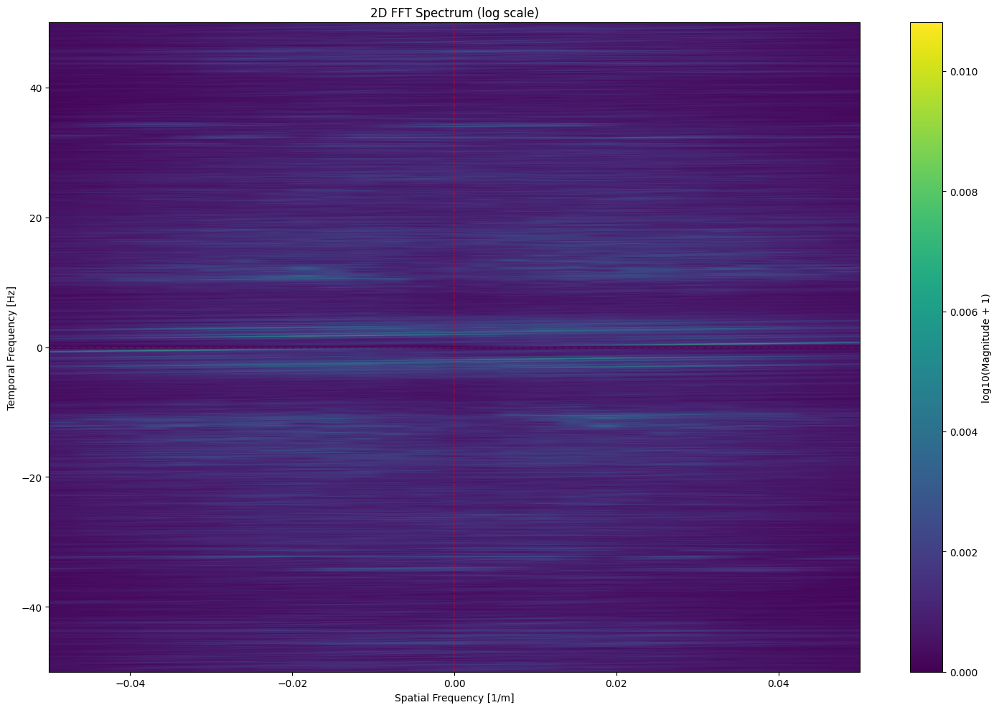

In [6]:
# 2D FFT dla analizy przestrzenno-czasowej
print("Obliczanie 2D FFT...")
fft2d = np.fft.fft2(data)
fft2d_shifted = np.fft.fftshift(fft2d)
magnitude_spectrum = np.abs(fft2d_shifted)

# Częstotliwości
freq_time = np.fft.fftshift(np.fft.fftfreq(data.shape[0], dt))
freq_space = np.fft.fftshift(np.fft.fftfreq(data.shape[1], dx))

# Wizualizacja widma 2D
plt.figure(figsize=(15, 10))
plt.imshow(np.log10(magnitude_spectrum + 1), aspect='auto', cmap='viridis',
           extent=[freq_space[0], freq_space[-1], freq_time[-1], freq_time[0]])
plt.colorbar(label='log10(Magnitude + 1)')
plt.xlabel('Spatial Frequency [1/m]')
plt.ylabel('Temporal Frequency [Hz]')
plt.title('2D FFT Spectrum (log scale)')
plt.xlim([-0.05, 0.05])  # Fokus na niskich częstotliwościach przestrzennych
plt.ylim([-50, 50])      # Fokus na niskich częstotliwościach czasowych
plt.axhline(y=0, color='r', linestyle='--', alpha=0.3)
plt.axvline(x=0, color='r', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

Filtrowanie: 0.1-5 Hz (bardzo niskie)...
Filtrowanie: 0.5-10 Hz (niskie)...
Filtrowanie: 1-20 Hz (niskie-średnie)...
Filtrowanie: 2-30 Hz (średnie)...
Filtrowanie: 5-50 Hz (średnie-wysokie)...


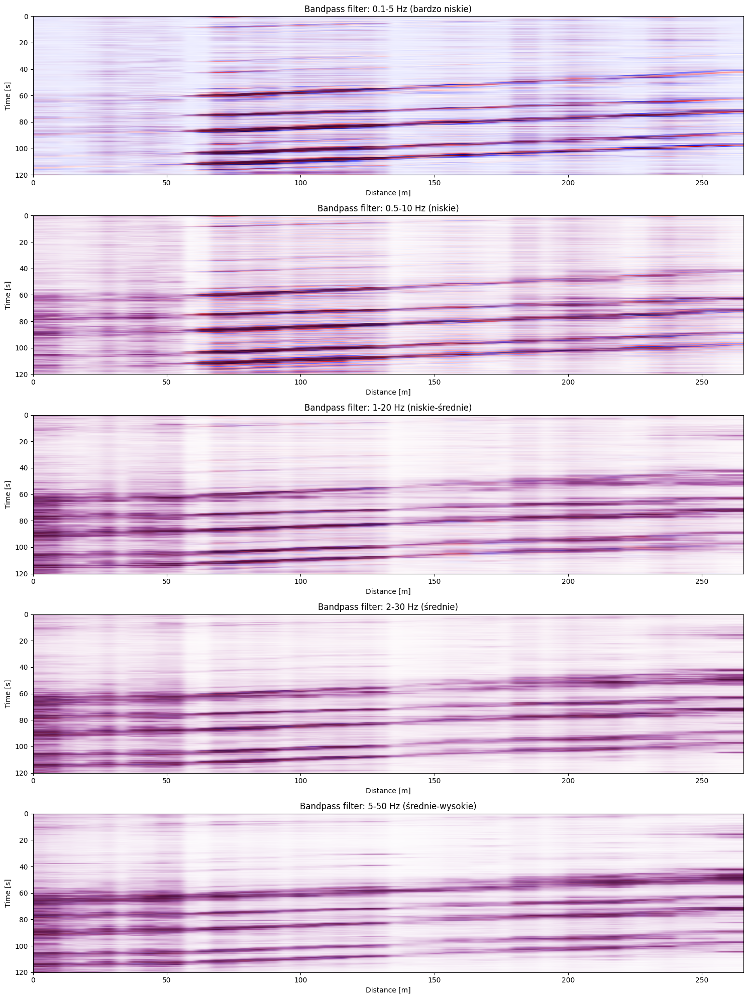

In [7]:
def apply_bandpass_filter(data, dt, low_freq, high_freq):
    """Filtr pasmowo-przepustowy dla każdego kanału"""
    filtered_data = np.zeros_like(data)
    
    for ch in range(data.shape[1]):
        signal = data[:, ch]
        fft_vals = np.fft.rfft(signal)
        fft_freq = np.fft.rfftfreq(len(signal), dt)
        
        # Maska dla pasma częstotliwości
        mask = (fft_freq >= low_freq) & (fft_freq <= high_freq)
        fft_vals[~mask] = 0
        
        # IFFT
        filtered_signal = np.fft.irfft(fft_vals, n=len(signal))
        filtered_data[:, ch] = filtered_signal
    
    return filtered_data

# Test różnych zakresów częstotliwości
frequency_ranges = [
    (0.1, 5, "0.1-5 Hz (bardzo niskie)"),
    (0.5, 10, "0.5-10 Hz (niskie)"),
    (1, 20, "1-20 Hz (niskie-średnie)"),
    (2, 30, "2-30 Hz (średnie)"),
    (5, 50, "5-50 Hz (średnie-wysokie)"),
]

fig, axes = plt.subplots(len(frequency_ranges), 1, figsize=(15, 20))

for idx, (low, high, label) in enumerate(frequency_ranges):
    print(f"Filtrowanie: {label}...")
    filtered = apply_bandpass_filter(data, dt, low, high)
    
    axes[idx].imshow(filtered, aspect='auto', cmap='seismic',
                     extent=[0, filtered.shape[1]*dx, filtered.shape[0]*dt, 0],
                     vmin=np.percentile(filtered, 1), vmax=np.percentile(filtered, 99))
    axes[idx].set_xlabel('Distance [m]')
    axes[idx].set_ylabel('Time [s]')
    axes[idx].set_title(f'Bandpass filter: {label}')

plt.tight_layout()
plt.show()

Filtr górnoprzepustowy > 50 Hz...
Filtr górnoprzepustowy > 100 Hz...
Filtr górnoprzepustowy > 150 Hz...
Filtr górnoprzepustowy > 200 Hz...


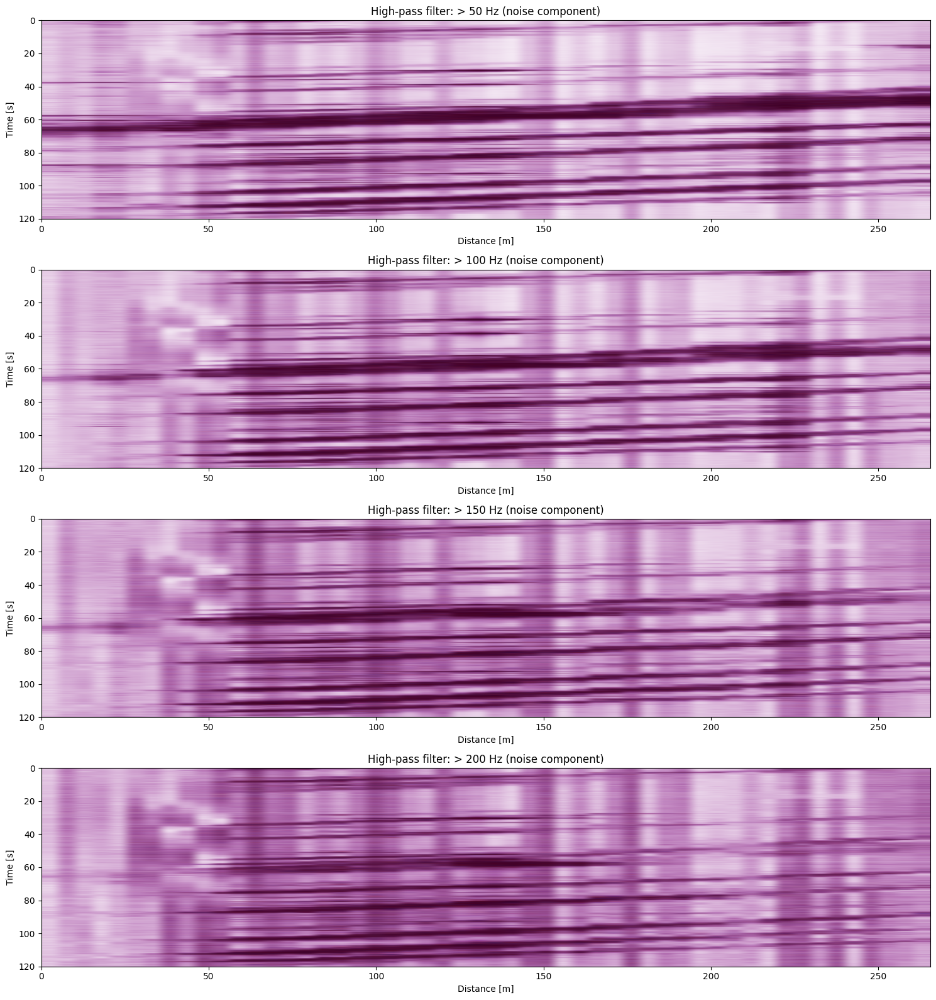

In [8]:
# Filtr górnoprzepustowy dla identyfikacji szumu
def apply_highpass_filter(data, dt, cutoff_freq):
    """Filtr górnoprzepustowy"""
    filtered_data = np.zeros_like(data)
    
    for ch in range(data.shape[1]):
        signal = data[:, ch]
        fft_vals = np.fft.rfft(signal)
        fft_freq = np.fft.rfftfreq(len(signal), dt)
        
        mask = fft_freq >= cutoff_freq
        fft_vals[~mask] = 0
        
        filtered_signal = np.fft.irfft(fft_vals, n=len(signal))
        filtered_data[:, ch] = filtered_signal
    
    return filtered_data

# Test wysokich częstotliwości (szum)
high_freq_tests = [50, 100, 150, 200]

fig, axes = plt.subplots(len(high_freq_tests), 1, figsize=(15, 16))

for idx, cutoff in enumerate(high_freq_tests):
    print(f"Filtr górnoprzepustowy > {cutoff} Hz...")
    high_freq_data = apply_highpass_filter(data, dt, cutoff)
    
    axes[idx].imshow(high_freq_data, aspect='auto', cmap='seismic',
                     extent=[0, high_freq_data.shape[1]*dx, high_freq_data.shape[0]*dt, 0],
                     vmin=np.percentile(high_freq_data, 5), 
                     vmax=np.percentile(high_freq_data, 95))
    axes[idx].set_xlabel('Distance [m]')
    axes[idx].set_ylabel('Time [s]')
    axes[idx].set_title(f'High-pass filter: > {cutoff} Hz (noise component)')

plt.tight_layout()
plt.show()

DC - 0.5 Hz: Power = 4.16e-06
0.5 - 1 Hz: Power = 6.06e-06
1 - 2 Hz: Power = 1.33e-05
2 - 5 Hz: Power = 3.00e-05
5 - 10 Hz: Power = 1.86e-05
10 - 20 Hz: Power = 1.13e-04
20 - 50 Hz: Power = 1.24e-04
50 - 100 Hz: Power = 1.39e-04
100 - 200 Hz: Power = 9.39e-05
200 Hz - Nyquist (312 Hz): Power = 2.30e-05


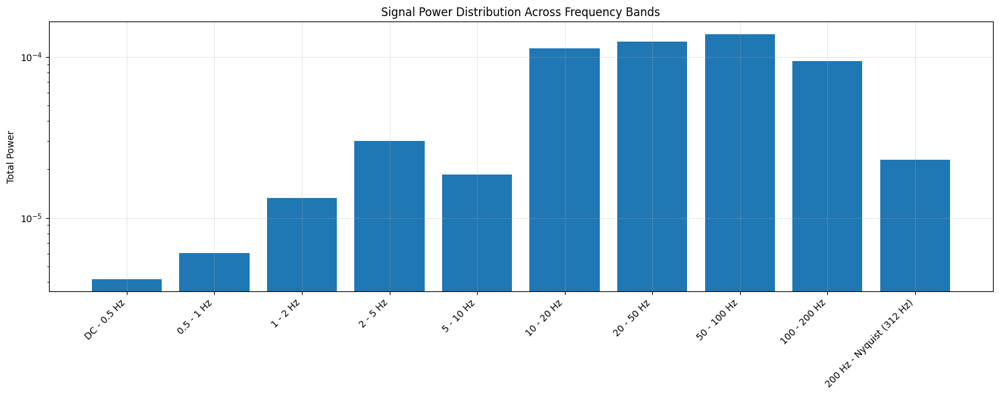

In [9]:
# Obliczenie całkowitej mocy w różnych pasmach częstotliwości
frequency_bands = [
    (0, 0.5, "DC - 0.5 Hz"),
    (0.5, 1, "0.5 - 1 Hz"),
    (1, 2, "1 - 2 Hz"),
    (2, 5, "2 - 5 Hz"),
    (5, 10, "5 - 10 Hz"),
    (10, 20, "10 - 20 Hz"),
    (20, 50, "20 - 50 Hz"),
    (50, 100, "50 - 100 Hz"),
    (100, 200, "100 - 200 Hz"),
    (200, fs/2, f"200 Hz - Nyquist ({fs/2:.0f} Hz)"),
]

band_powers = []

for low, high, label in frequency_bands:
    mask = (fft_freq >= low) & (fft_freq < high)
    power = np.sum(mean_fft_mag[mask]**2)
    band_powers.append((label, power))
    print(f"{label}: Power = {power:.2e}")

# Wizualizacja mocy w pasmach
labels, powers = zip(*band_powers)
plt.figure(figsize=(15, 6))
plt.bar(range(len(labels)), powers)
plt.xticks(range(len(labels)), labels, rotation=45, ha='right')
plt.ylabel('Total Power')
plt.title('Signal Power Distribution Across Frequency Bands')
plt.yscale('log')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [14]:
def multi_bandpass_filter(data, dt, frequency_ranges):
    """
    Filtr zachowujący wiele przedziałów częstotliwości
    
    Parameters:
    -----------
    data : np.ndarray
        Dane wejściowe (time x channels)
    dt : float
        Czas próbkowania [s]
    frequency_ranges : list of tuples
        Lista przedziałów częstotliwości do zachowania
        np. [(10, 20), (40, 50), (80, 100)]
    
    Returns:
    --------
    filtered_data : np.ndarray
        Przefiltrowane dane
    """
    filtered_data = np.zeros_like(data, dtype=np.float32)
    
    print(f"Filtrowanie z przedziałami: {frequency_ranges}")
    
    for ch in range(data.shape[1]):
        if ch % 100 == 0:
            print(f"  Processing channel {ch}/{data.shape[1]}")
        
        signal = data[:, ch]
        
        # FFT
        fft_vals = np.fft.rfft(signal)
        fft_freq = np.fft.rfftfreq(len(signal), dt)
        
        # Tworzenie maski - początkowo wszystko wyzerowane
        mask = np.zeros(len(fft_freq), dtype=bool)
        
        # Dla każdego przedziału dodajemy do maski
        for low_freq, high_freq in frequency_ranges:
            range_mask = (fft_freq >= low_freq) & (fft_freq <= high_freq)
            mask = mask | range_mask  # OR logiczny
        
        # Zerowanie częstotliwości spoza przedziałów
        fft_vals[~mask] = 0
        
        # Odwrotna FFT
        filtered_signal = np.fft.irfft(fft_vals, n=len(signal))
        filtered_data[:, ch] = filtered_signal
    
    return filtered_data


# Funkcja do wizualizacji różnych kombinacji
def test_frequency_ranges(data, dt, dx, ranges_list, titles=None):
    """
    Testuje różne kombinacje przedziałów częstotliwości
    
    Parameters:
    -----------
    data : np.ndarray
        Dane wejściowe
    dt : float
        Czas próbkowania
    dx : float
        Rozdzielczość przestrzenna
    ranges_list : list of list of tuples
        Lista kombinacji przedziałów do przetestowania
        np. [[(10, 20)], [(10, 20), (40, 50)], [(5, 50)]]
    titles : list of str, optional
        Tytuły dla każdej kombinacji
    """
    n_tests = len(ranges_list)
    fig, axes = plt.subplots(n_tests, 1, figsize=(15, 5 * n_tests))
    
    if n_tests == 1:
        axes = [axes]
    
    for idx, ranges in enumerate(ranges_list):
        print(f"\n{'='*60}")
        print(f"Test {idx+1}/{n_tests}: {ranges}")
        print(f"{'='*60}")
        
        filtered = multi_bandpass_filter(data, dt, ranges)
        
        # Wizualizacja
        axes[idx].imshow(filtered, aspect='auto', cmap='seismic',
                        extent=[0, filtered.shape[1]*dx, filtered.shape[0]*dt, 0],
                        vmin=np.percentile(filtered, 1), 
                        vmax=np.percentile(filtered, 99))
        axes[idx].set_xlabel('Distance [m]')
        axes[idx].set_ylabel('Time [s]')
        
        if titles and idx < len(titles):
            title = titles[idx]
        else:
            title = f'Frequency ranges: {ranges}'
        axes[idx].set_title(title)
    
    plt.tight_layout()
    plt.show()

Filtrowanie z przedziałami: [(10, 15)]
  Processing channel 0/52


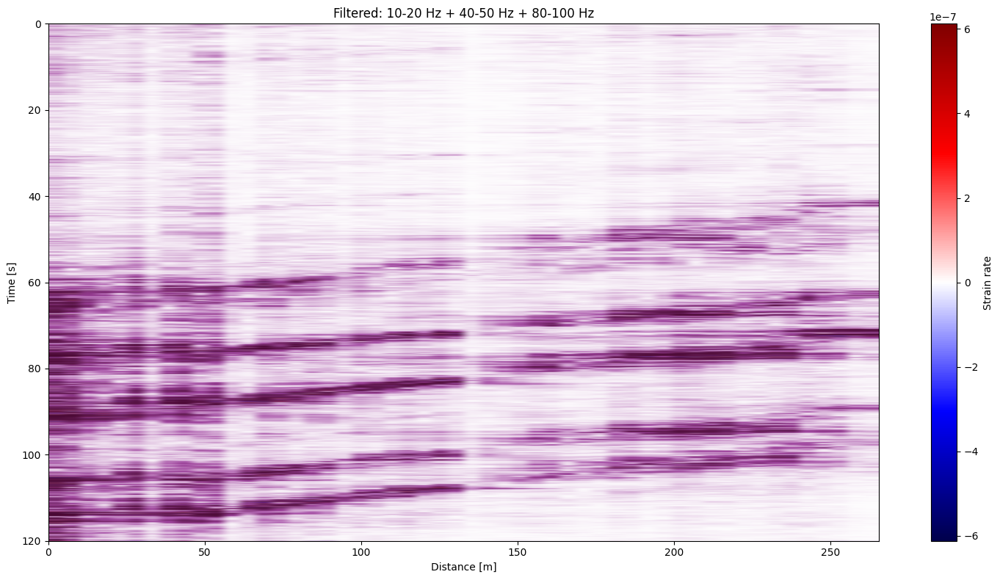

In [26]:
# Przykład 2: 10-20 Hz + 40-50 Hz + 80-100 Hz
data_filtered = multi_bandpass_filter(data, dt, [(10, 15)])

plt.figure(figsize=(15, 8))
plt.imshow(data_filtered, aspect='auto', cmap='seismic',
           extent=[0, data_filtered.shape[1]*dx, data_filtered.shape[0]*dt, 0],
           vmin=np.percentile(data_filtered, 1), 
           vmax=np.percentile(data_filtered, 99))
plt.colorbar(label='Strain rate')
plt.xlabel('Distance [m]')
plt.ylabel('Time [s]')
plt.title('Filtered: 10-20 Hz + 40-50 Hz + 80-100 Hz')
plt.tight_layout()
plt.show()

In [114]:
# for i in range(0,200):
#     data_filtered = multi_bandpass_filter(data, dt, [(i, i+2)])

#     plt.figure(figsize=(15, 8))
#     plt.imshow(data_filtered, aspect='auto', cmap='seismic',
#             extent=[0, data_filtered.shape[1]*dx, data_filtered.shape[0]*dt, 0],
#             vmin=np.percentile(data_filtered, 1), 
#             vmax=np.percentile(data_filtered, 99))
#     plt.colorbar(label='Strain rate')
#     plt.xlabel('Distance [m]')
#     plt.ylabel('Time [s]')
#     plt.title(f'{i}, {i+2}')
#     plt.tight_layout()
#     plt.show()

In [35]:
def subtract_frequency_bands(data, dt, dx, frequency_ranges):
    """
    Odejmuje kolejne pasma częstotliwości od podstawowego
    
    Parameters:
    -----------
    data : np.ndarray
        Dane wejściowe (time x channels)
    dt : float
        Czas próbkowania [s]
    dx : float
        Rozdzielczość przestrzenna [m]
    frequency_ranges : list of tuples
        Lista przedziałów częstotliwości
        Pierwszy przedział = podstawa
        Kolejne = odejmowane od podstawy
        np. [(1, 100), (50, 100), (80, 100)]
    
    Returns:
    --------
    results : list of np.ndarray
        Lista wyników po każdym odejmowaniu
    """
    if len(frequency_ranges) < 2:
        print("Potrzebuję minimum 2 przedziałów (podstawa + 1 do odjęcia)")
        return None
    
    # Filtrowanie podstawowe (pierwszy przedział)
    base_range = frequency_ranges[0]
    print(f"\n{'='*60}")
    print(f"PODSTAWA: {base_range[0]}-{base_range[1]} Hz")
    print(f"{'='*60}")
    base_filtered = multi_bandpass_filter(data, dt, [base_range])
    
    # Lista wyników
    results = [base_filtered]
    
    # Tworzenie figury
    n_plots = len(frequency_ranges)  # podstawa + wszystkie odejmowania
    fig, axes = plt.subplots(n_plots, 1, figsize=(15, 5 * n_plots))
    
    if n_plots == 1:
        axes = [axes]
    
    # Plot podstawy
    im0 = axes[0].imshow(base_filtered, aspect='auto', cmap='seismic',
                         extent=[0, base_filtered.shape[1]*dx, base_filtered.shape[0]*dt, 0],
                         vmin=np.percentile(base_filtered, 1), 
                         vmax=np.percentile(base_filtered, 99))
    axes[0].set_xlabel('Distance [m]')
    axes[0].set_ylabel('Time [s]')
    axes[0].set_title(f'PODSTAWA: {base_range[0]}-{base_range[1]} Hz')
    plt.colorbar(im0, ax=axes[0], label='Strain rate')
    
    # Odejmowanie kolejnych pasm
    current_result = base_filtered.copy()
    
    for idx, subtract_range in enumerate(frequency_ranges[1:], start=1):
        print(f"\n{'='*60}")
        print(f"Krok {idx}: Odejmuję {subtract_range[0]}-{subtract_range[1]} Hz")
        print(f"{'='*60}")
        
        # Filtruj pasmo do odjęcia
        subtract_filtered = multi_bandpass_filter(data, dt, [subtract_range])
        
        # Odejmij i wartość absolutna
        current_result = np.abs(current_result - subtract_filtered)
        results.append(current_result.copy())
        
        # Statystyki
        print(f"  Min: {np.min(current_result):.2e}")
        print(f"  Max: {np.max(current_result):.2e}")
        print(f"  Mean: {np.mean(current_result):.2e}")
        print(f"  Std: {np.std(current_result):.2e}")
        
        # Plot
        im = axes[idx].imshow(current_result, aspect='auto', cmap='seismic',
                             extent=[0, current_result.shape[1]*dx, current_result.shape[0]*dt, 0],
                             vmin=np.percentile(current_result, 1), 
                             vmax=np.percentile(current_result, 99))
        axes[idx].set_xlabel('Distance [m]')
        axes[idx].set_ylabel('Time [s]')
        
        # Tytuł pokazujący historię operacji
        operations = [f"{base_range[0]}-{base_range[1]} Hz"]
        for j in range(1, idx + 1):
            operations.append(f"- |{frequency_ranges[j][0]}-{frequency_ranges[j][1]} Hz|")
        title = ' '.join(operations)
        axes[idx].set_title(f'Krok {idx}: {title}')
        plt.colorbar(im, ax=axes[idx], label='Strain rate')
    
    plt.tight_layout()
    plt.show()
    
    return results


def subtract_frequency_bands_step_by_step(data, dt, dx, frequency_ranges):
    """
    Jak wyżej, ale pokazuje każdy krok na osobnym wykresie
    """
    if len(frequency_ranges) < 2:
        print("Potrzebuję minimum 2 przedziałów (podstawa + 1 do odjęcia)")
        return None
    
    # Filtrowanie podstawowe
    base_range = frequency_ranges[0]
    print(f"\n{'='*60}")
    print(f"PODSTAWA: {base_range[0]}-{base_range[1]} Hz")
    print(f"{'='*60}")
    base_filtered = multi_bandpass_filter(data, dt, [base_range])
    
    # Plot podstawy
    plt.figure(figsize=(15, 8))
    plt.imshow(base_filtered, aspect='auto', cmap='seismic',
               extent=[0, base_filtered.shape[1]*dx, base_filtered.shape[0]*dt, 0],
               vmin=np.percentile(base_filtered, 1), 
               vmax=np.percentile(base_filtered, 99))
    plt.colorbar(label='Strain rate')
    plt.xlabel('Distance [m]')
    plt.ylabel('Time [s]')
    plt.title(f'PODSTAWA: {base_range[0]}-{base_range[1]} Hz')
    plt.tight_layout()
    plt.show()
    
    results = [base_filtered]
    current_result = base_filtered.copy()
    
    # Odejmowanie kolejnych pasm
    for idx, subtract_range in enumerate(frequency_ranges[1:], start=1):
        print(f"\n{'='*60}")
        print(f"Krok {idx}: Odejmuję {subtract_range[0]}-{subtract_range[1]} Hz")
        print(f"{'='*60}")
        
        # Filtruj pasmo do odjęcia
        subtract_filtered = multi_bandpass_filter(data, dt, [subtract_range])
        
        # Odejmij i ustaw < 0 na 0
        current_result = current_result - subtract_filtered
        current_result[current_result < 0] = 0
        results.append(current_result.copy())
        
        # Statystyki
        print(f"  Min: {np.min(current_result):.2e}")
        print(f"  Max: {np.max(current_result):.2e}")
        print(f"  Mean: {np.mean(current_result):.2e}")
        print(f"  Std: {np.std(current_result):.2e}")
        
        # Plot
        plt.figure(figsize=(15, 8))
        plt.imshow(current_result, aspect='auto', cmap='seismic',
                   extent=[0, current_result.shape[1]*dx, current_result.shape[0]*dt, 0],
                   vmin=np.percentile(current_result, 1), 
                   vmax=np.percentile(current_result, 99))
        plt.colorbar(label='Strain rate')
        plt.xlabel('Distance [m]')
        plt.ylabel('Time [s]')
        
        # Tytuł
        operations = [f"{base_range[0]}-{base_range[1]} Hz"]
        for j in range(1, idx + 1):
            operations.append(f"- {frequency_ranges[j][0]}-{frequency_ranges[j][1]} Hz")
        title = ' '.join(operations) + " (clip at 0)"
        plt.title(f'Krok {idx}: {title}')
        plt.tight_layout()
        plt.show()
    
    return results


PODSTAWA: 0-1 Hz (mode: abs)
Filtrowanie z przedziałami: [(0, 1)]
  Processing channel 0/52


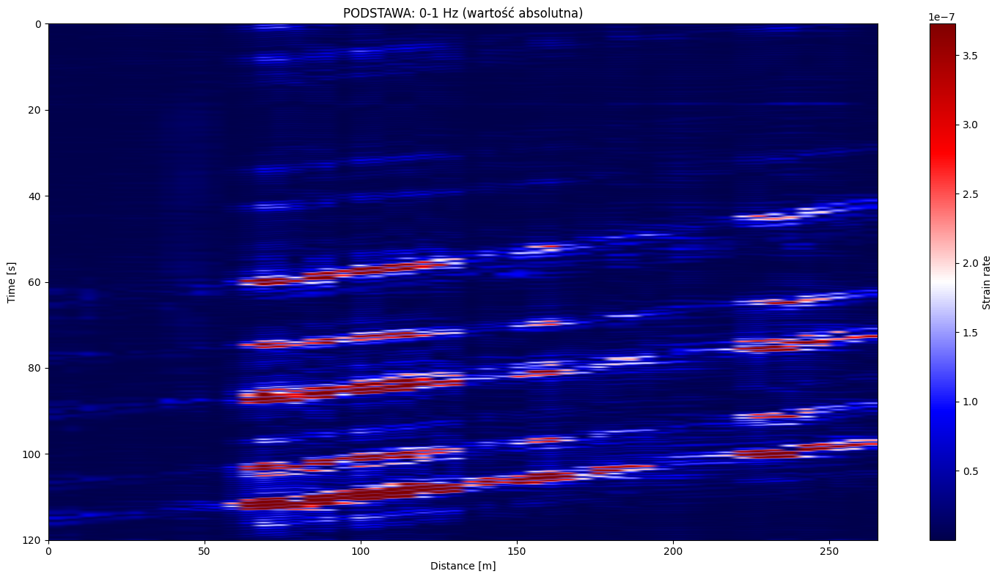


Krok 1: Odejmuję 2-10 Hz (mode: brak)
Filtrowanie z przedziałami: [(2, 10)]
  Processing channel 0/52
  Min: -6.76e-06
  Max: 6.80e-06
  Mean: 2.77e-08
  Std: 2.08e-07


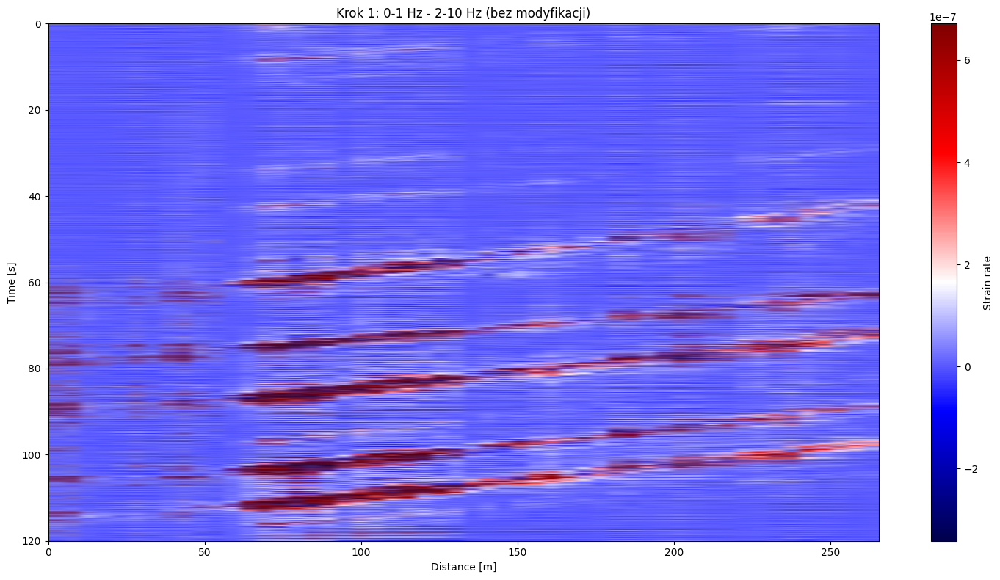

In [41]:
def subtract_frequency_bands_step_by_step(data, dt, dx, frequency_ranges, 
                                         base_mode='brak', subtract_mode='clip'):
    """
    Odejmuje kolejne pasma częstotliwości od podstawowego
    
    Parameters:
    -----------
    data : np.ndarray
        Dane wejściowe (time x channels)
    dt : float
        Czas próbkowania [s]
    dx : float
        Rozdzielczość przestrzenna [m]
    frequency_ranges : list of tuples
        Lista przedziałów częstotliwości
        Pierwszy przedział = podstawa
        Kolejne = odejmowane od podstawy
    base_mode : str
        Tryb dla podstawy: 'brak', 'abs', 'clip'
    subtract_mode : str
        Tryb po każdym odejmowaniu: 'brak', 'abs', 'clip'
    
    Returns:
    --------
    results : list of np.ndarray
        Lista wyników po każdym odejmowaniu
    """
    if len(frequency_ranges) < 2:
        print("Potrzebuję minimum 2 przedziałów (podstawa + 1 do odjęcia)")
        return None
    
    # Filtrowanie podstawowe
    base_range = frequency_ranges[0]
    print(f"\n{'='*60}")
    print(f"PODSTAWA: {base_range[0]}-{base_range[1]} Hz (mode: {base_mode})")
    print(f"{'='*60}")
    base_filtered = multi_bandpass_filter(data, dt, [base_range])
    
    # Zastosuj tryb do podstawy
    if base_mode == 'abs':
        base_filtered = np.abs(base_filtered)
        mode_text = "(wartość absolutna)"
    elif base_mode == 'clip':
        base_filtered[base_filtered < 0] = 0
        mode_text = "(clip at 0)"
    else:  # 'brak'
        mode_text = "(bez modyfikacji)"
    
    # Plot podstawy
    plt.figure(figsize=(15, 8))
    plt.imshow(base_filtered, aspect='auto', cmap='seismic',
               extent=[0, base_filtered.shape[1]*dx, base_filtered.shape[0]*dt, 0],
               vmin=np.percentile(base_filtered, 1), 
               vmax=np.percentile(base_filtered, 99))
    plt.colorbar(label='Strain rate')
    plt.xlabel('Distance [m]')
    plt.ylabel('Time [s]')
    plt.title(f'PODSTAWA: {base_range[0]}-{base_range[1]} Hz {mode_text}')
    plt.tight_layout()
    plt.show()
    
    results = [base_filtered]
    current_result = base_filtered.copy()
    
    # Odejmowanie kolejnych pasm
    for idx, subtract_range in enumerate(frequency_ranges[1:], start=1):
        print(f"\n{'='*60}")
        print(f"Krok {idx}: Odejmuję {subtract_range[0]}-{subtract_range[1]} Hz (mode: {subtract_mode})")
        print(f"{'='*60}")
        
        # Filtruj pasmo do odjęcia
        subtract_filtered = multi_bandpass_filter(data, dt, [subtract_range])
        
        # Odejmij
        current_result = current_result - subtract_filtered
        
        # Zastosuj tryb po odejmowaniu
        if subtract_mode == 'abs':
            current_result = np.abs(current_result)
            mode_text = "(wartość absolutna)"
        elif subtract_mode == 'clip':
            current_result[current_result < 0] = 0
            mode_text = "(clip at 0)"
        else:  # 'brak'
            mode_text = "(bez modyfikacji)"
        
        results.append(current_result.copy())
        
        # Statystyki
        print(f"  Min: {np.min(current_result):.2e}")
        print(f"  Max: {np.max(current_result):.2e}")
        print(f"  Mean: {np.mean(current_result):.2e}")
        print(f"  Std: {np.std(current_result):.2e}")
        
        # Plot
        plt.figure(figsize=(15, 8))
        plt.imshow(current_result, aspect='auto', cmap='seismic',
                   extent=[0, current_result.shape[1]*dx, current_result.shape[0]*dt, 0],
                   vmin=np.percentile(current_result, 1), 
                   vmax=np.percentile(current_result, 99))
        plt.colorbar(label='Strain rate')
        plt.xlabel('Distance [m]')
        plt.ylabel('Time [s]')
        
        # Tytuł
        operations = [f"{base_range[0]}-{base_range[1]} Hz"]
        for j in range(1, idx + 1):
            operations.append(f"- {frequency_ranges[j][0]}-{frequency_ranges[j][1]} Hz")
        title = ' '.join(operations) + f" {mode_text}"
        plt.title(f'Krok {idx}: {title}')
        plt.tight_layout()
        plt.show()
    
    return results


# PRZYKŁADY UŻYCIA:

# 1. Podstawa: clip at 0, Odejmowanie: clip at 0
results = subtract_frequency_bands_step_by_step(data, dt, dx, 
    [(0, 1), (2, 10)],
    base_mode='abs', subtract_mode='brak')


PODSTAWA: 0-2 Hz (mode: brak)
Filtrowanie z przedziałami: [(0, 2)]
  Processing channel 0/52


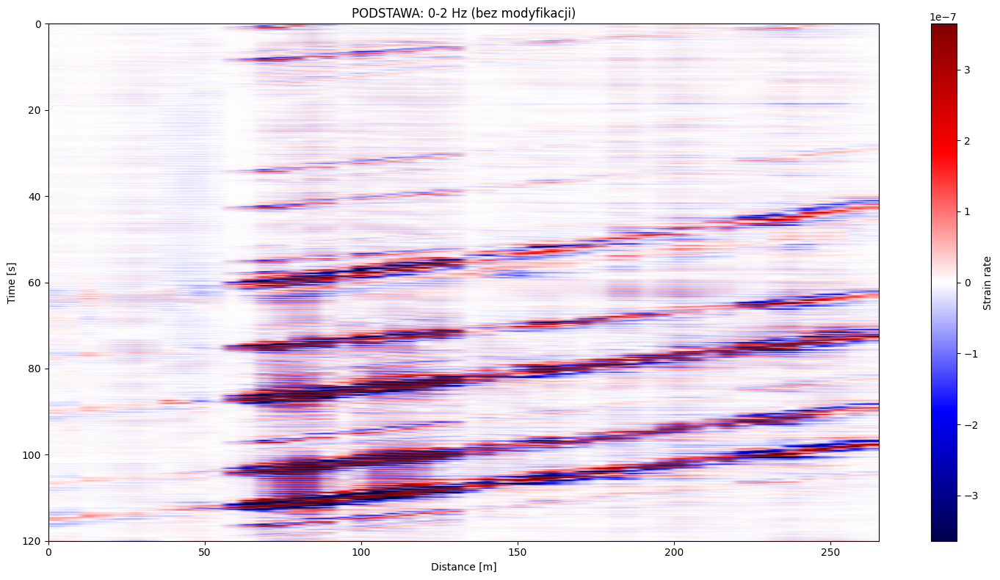


Krok 1: Odejmuję 50-500 Hz (mode: abs)
Filtrowanie z przedziałami: [(50, 500)]
  Processing channel 0/52
  Min: 1.07e-14
  Max: 3.71e-05
  Mean: 1.42e-07
  Std: 4.50e-07


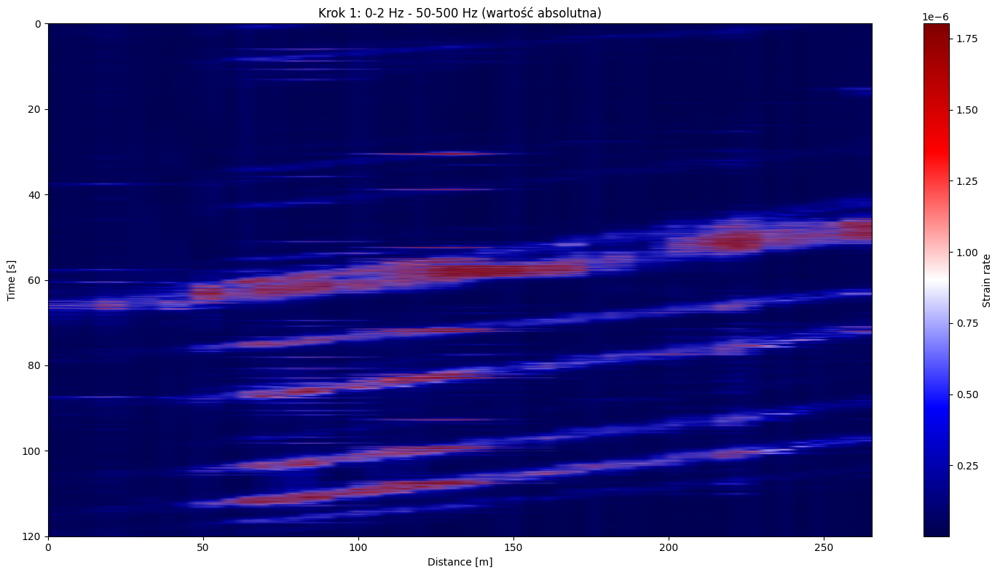

BINARY THRESHOLD FILTER
Threshold percentile: 85%
Mode: absolute
Keep original values: False
Threshold value (absolute): 1.708387e-07
Output: Binary (0 or 1)

Statistics:
  Samples above threshold: 585000 (15.00%)
  Samples below threshold: 3315000 (85.00%)



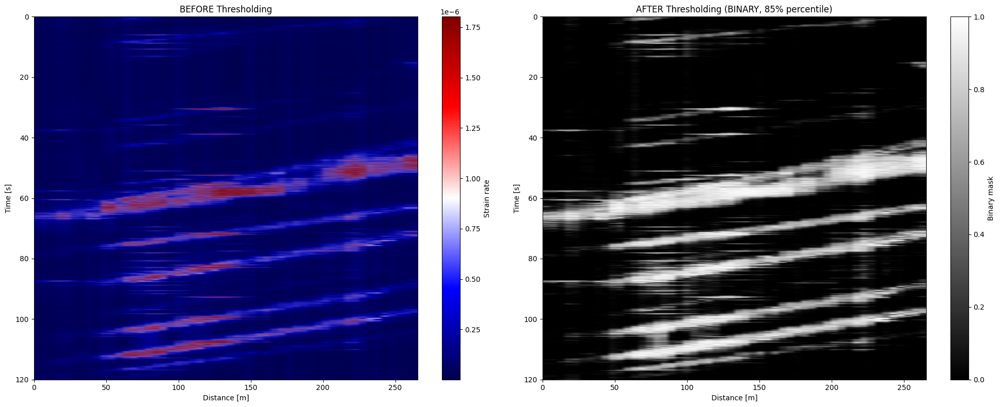


PODSTAWA: 0-2 Hz (mode: brak)
Filtrowanie z przedziałami: [(0, 2)]
  Processing channel 0/52


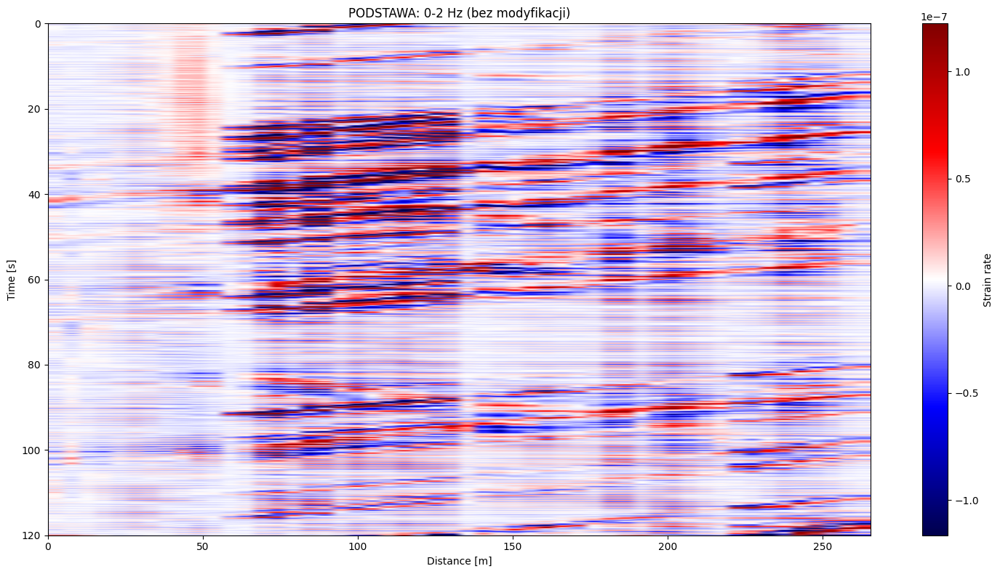


Krok 1: Odejmuję 50-500 Hz (mode: abs)
Filtrowanie z przedziałami: [(50, 500)]
  Processing channel 0/52
  Min: 1.40e-14
  Max: 4.37e-05
  Mean: 1.61e-07
  Std: 5.64e-07


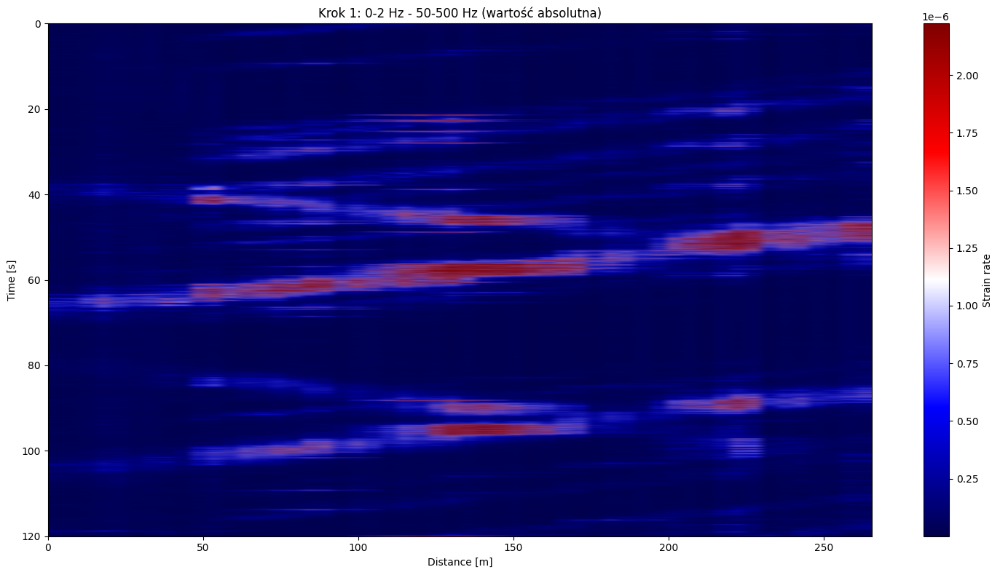

BINARY THRESHOLD FILTER
Threshold percentile: 85%
Mode: absolute
Keep original values: False
Threshold value (absolute): 1.890362e-07
Output: Binary (0 or 1)

Statistics:
  Samples above threshold: 585000 (15.00%)
  Samples below threshold: 3315000 (85.00%)



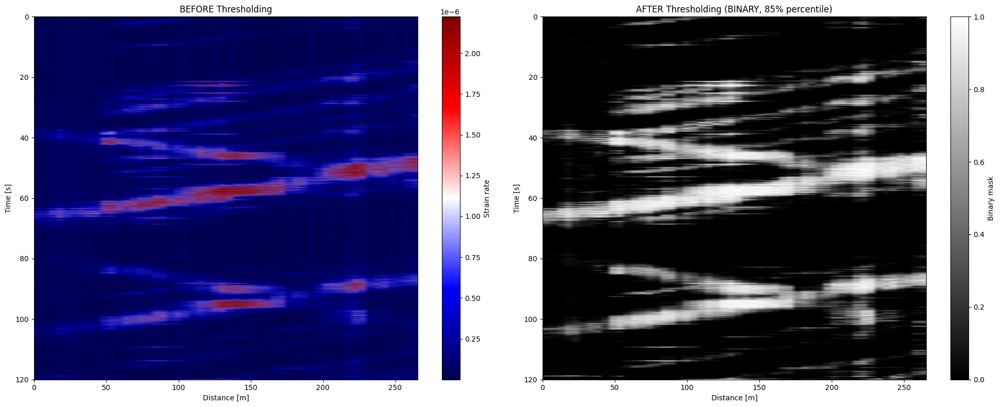


PODSTAWA: 0-2 Hz (mode: brak)
Filtrowanie z przedziałami: [(0, 2)]
  Processing channel 0/52


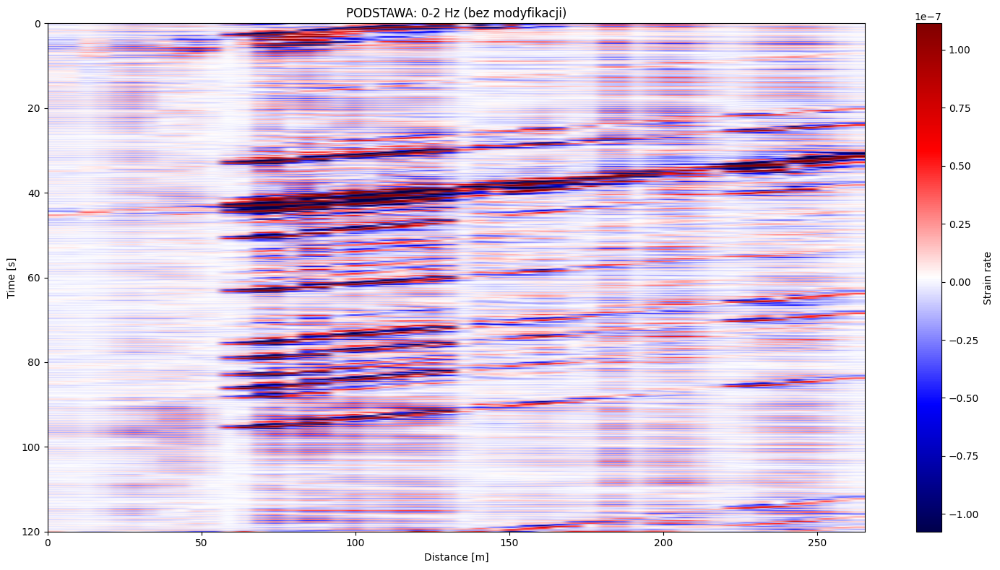


Krok 1: Odejmuję 50-500 Hz (mode: abs)
Filtrowanie z przedziałami: [(50, 500)]
  Processing channel 0/52
  Min: 4.00e-15
  Max: 3.35e-05
  Mean: 8.04e-08
  Std: 3.35e-07


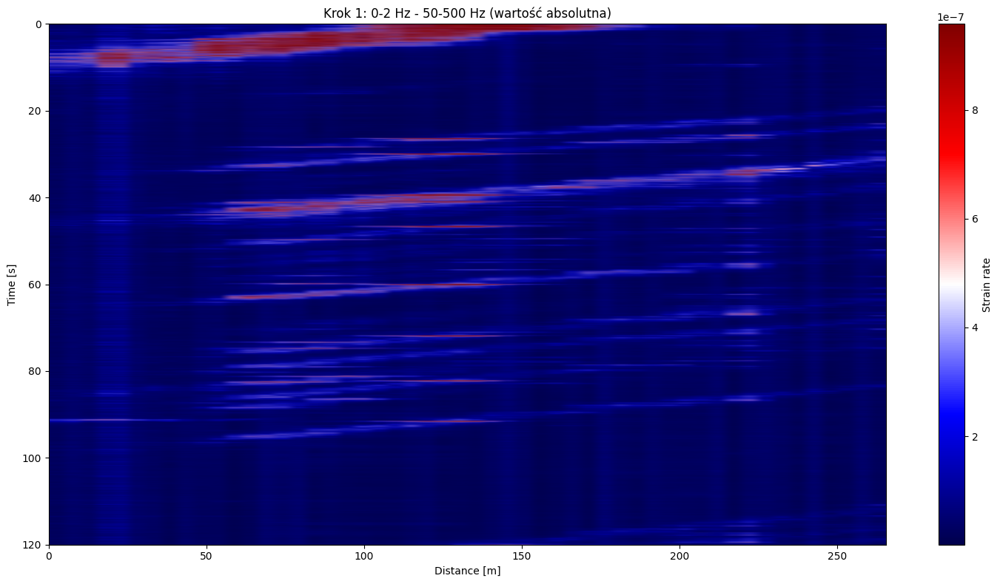

BINARY THRESHOLD FILTER
Threshold percentile: 85%
Mode: absolute
Keep original values: False
Threshold value (absolute): 9.243454e-08
Output: Binary (0 or 1)

Statistics:
  Samples above threshold: 585000 (15.00%)
  Samples below threshold: 3315000 (85.00%)



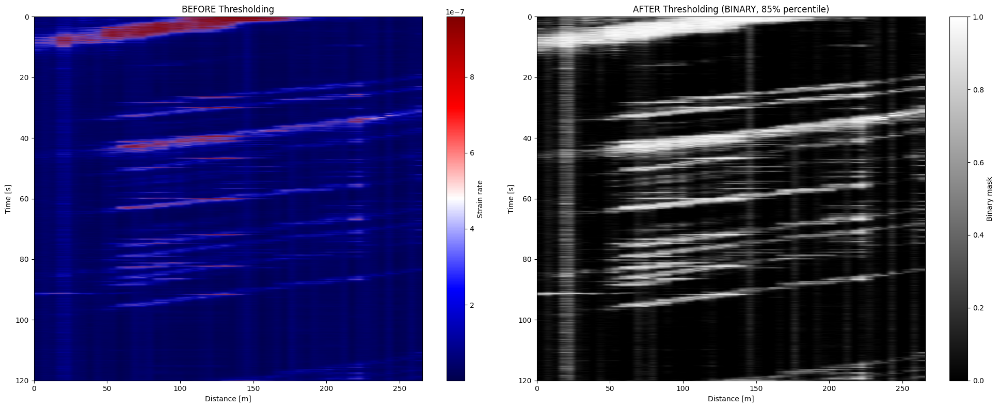

In [59]:
def binary_threshold_filter(data, dt, dx, threshold_percentile=50, mode='absolute', keep_values=False):
    """
    Apply binary thresholding to DAS data
    
    Parameters:
    -----------
    data : np.ndarray
        2D numpy array (time x channels)
    dt : float
        Czas próbkowania [s]
    dx : float
        Rozdzielczość przestrzenna [m]
    threshold_percentile : float
        Percentile threshold for binarization (default: 50)
    mode : str
        'absolute': Threshold based on absolute values |data|
        'positive': Threshold only positive values
        'negative': Threshold only negative values
    keep_values : bool
        If True, keeps original values above threshold
        If False, creates binary output (0 or 1)
    
    Returns:
    --------
    np.ndarray : Thresholded data array
    """
    data_copy = data.copy()
    
    print("="*70)
    print("BINARY THRESHOLD FILTER")
    print("="*70)
    print(f"Threshold percentile: {threshold_percentile}%")
    print(f"Mode: {mode}")
    print(f"Keep original values: {keep_values}")
    
    # Calculate threshold based on mode
    if mode == 'absolute':
        threshold_value = np.percentile(np.abs(data_copy), threshold_percentile)
        mask = np.abs(data_copy) > threshold_value
        print(f"Threshold value (absolute): {threshold_value:.6e}")
        
    elif mode == 'positive':
        positive_data = data_copy[data_copy > 0]
        if len(positive_data) > 0:
            threshold_value = np.percentile(positive_data, threshold_percentile)
            mask = data_copy > threshold_value
        else:
            threshold_value = 0
            mask = np.zeros_like(data_copy, dtype=bool)
        print(f"Threshold value (positive): {threshold_value:.6e}")
        
    elif mode == 'negative':
        negative_data = data_copy[data_copy < 0]
        if len(negative_data) > 0:
            threshold_value = np.percentile(np.abs(negative_data), threshold_percentile)
            mask = data_copy < -threshold_value
        else:
            threshold_value = 0
            mask = np.zeros_like(data_copy, dtype=bool)
        print(f"Threshold value (negative): {threshold_value:.6e}")
    
    # Apply threshold
    if keep_values:
        filtered_data = np.where(mask, data_copy, 0)
        print(f"Output: Original values above threshold, zeros below")
    else:
        filtered_data = mask.astype(float)
        print(f"Output: Binary (0 or 1)")
    
    # Statistics
    total_samples = data_copy.size
    samples_above = np.sum(mask)
    percent_above = (samples_above / total_samples) * 100
    
    print(f"\nStatistics:")
    print(f"  Samples above threshold: {samples_above} ({percent_above:.2f}%)")
    print(f"  Samples below threshold: {total_samples - samples_above} ({100 - percent_above:.2f}%)")
    print("="*70 + "\n")
    
    # PLOT
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))
    
    # Original
    im0 = axes[0].imshow(data_copy, aspect='auto', cmap='seismic',
                        extent=[0, data_copy.shape[1]*dx, data_copy.shape[0]*dt, 0],
                        vmin=np.percentile(data_copy, 1), 
                        vmax=np.percentile(data_copy, 99))
    axes[0].set_xlabel('Distance [m]')
    axes[0].set_ylabel('Time [s]')
    axes[0].set_title('BEFORE Thresholding')
    plt.colorbar(im0, ax=axes[0], label='Strain rate')
    
    # After threshold
    if keep_values:
        # Use seismic colormap for original values
        im1 = axes[1].imshow(filtered_data, aspect='auto', cmap='seismic',
                            extent=[0, filtered_data.shape[1]*dx, filtered_data.shape[0]*dt, 0],
                            vmin=np.percentile(filtered_data[filtered_data != 0], 1) if np.any(filtered_data != 0) else 0,
                            vmax=np.percentile(filtered_data[filtered_data != 0], 99) if np.any(filtered_data != 0) else 1)
        axes[1].set_title(f'AFTER Thresholding (keep values, {threshold_percentile}% percentile)')
    else:
        # Use binary colormap (black and white)
        im1 = axes[1].imshow(filtered_data, aspect='auto', cmap='gray',
                            extent=[0, filtered_data.shape[1]*dx, filtered_data.shape[0]*dt, 0],
                            vmin=0, vmax=1)
        axes[1].set_title(f'AFTER Thresholding (BINARY, {threshold_percentile}% percentile)')
    
    axes[1].set_xlabel('Distance [m]')
    axes[1].set_ylabel('Time [s]')
    plt.colorbar(im1, ax=axes[1], label='Binary mask' if not keep_values else 'Strain rate')
    
    plt.tight_layout()
    plt.show()
    
    return filtered_data


# ODPAL TO:

data_dict = get_range(range1[0], range1[1])
data = data_dict['data']
dt = data_dict['dt']
dx = data_dict['dx']

results = subtract_frequency_bands_step_by_step(data, dt, dx, 
    [(0, 2), (50, 500)],
    base_mode='brak', subtract_mode='abs')

# Weź ostatni wynik i zastosuj threshold
final_result = results[-1]
binary_result = binary_threshold_filter(final_result, dt, dx,
                                       threshold_percentile=85, 
                                       mode='absolute', 
                                       keep_values=False)  # False = BINARY!

data_dict = get_range(range2[0], range2[1])
data = data_dict['data']
dt = data_dict['dt']
dx = data_dict['dx']

results = subtract_frequency_bands_step_by_step(data, dt, dx, 
    [(0, 2), (50, 500)],
    base_mode='brak', subtract_mode='abs')

# Weź ostatni wynik i zastosuj threshold
final_result = results[-1]
binary_result = binary_threshold_filter(final_result, dt, dx,
                                       threshold_percentile=85, 
                                       mode='absolute', 
                                       keep_values=False)  # False = BINARY!

data_dict = get_range(range3[0], range3[1])
data = data_dict['data']
dt = data_dict['dt']
dx = data_dict['dx']

results = subtract_frequency_bands_step_by_step(data, dt, dx, 
    [(0, 2), (50, 500)],
    base_mode='brak', subtract_mode='abs')

# Weź ostatni wynik i zastosuj threshold
final_result = results[-1]
binary_result = binary_threshold_filter(final_result, dt, dx,
                                       threshold_percentile=85, 
                                       mode='absolute', 
                                       keep_values=False)  # False = BINARY!

In [70]:
# ============================================================================
# MORPHOLOGICAL CLOSING - Łączy przerwy w liniach pojazdów
# ============================================================================
from skimage.morphology import closing, rectangle, disk, binary_opening
from skimage.measure import label, regionprops
from skimage.transform import resize

def connect_vehicle_lines(binary_data, closing_size=15):
    """
    Łączy przerwy w liniach pojazdów używając morphological closing.
    
    Parameters:
    -----------
    binary_data : np.ndarray
        Binary mask (0/1)
    closing_size : int
        Rozmiar struktury dla closing (większy = łączy większe przerwy)
    
    Returns:
    --------
    np.ndarray : Binary mask z połączonymi liniami
    """
    # Rectangle structure - dla łączenia przerwanych linii
    selem = rectangle(closing_size, closing_size)
    
    closed = closing(binary_data, selem)
    
    print(f"Morphological closing: size={closing_size}")
    print(f"  Before: {np.sum(binary_data)} pixels")
    print(f"  After:  {np.sum(closed)} pixels")
    
    return closed


def extract_components_with_velocities(binary_data, dt, dx, 
                                      opening_size=1, 
                                      min_area=15):
    """
    Ekstraktuje connected components i oblicza prędkości.
    
    Parameters:
    -----------
    binary_data : np.ndarray
        Binarna maska (0/1)
    dt : float
        Temporal sampling (s)
    dx : float
        Spatial sampling (m)
    opening_size : int
        Rozmiar struktury do morphological opening
    min_area : int
        Minimalna powierzchnia komponentu
    
    Returns:
    --------
    tuple : (component_data, labeled, opened)
        - component_data: lista słowników z info o komponentach
        - labeled: obraz z labelowanymi komponentami
        - opened: obraz po morphological opening
    """
    # Morphological opening - separuje obiekty
    if opening_size > 0:
        selem = disk(opening_size)
        opened = binary_opening(binary_data, selem)
    else:
        opened = binary_data.copy()
    
    # Connected components
    labeled = label(opened, connectivity=2)
    regions = regionprops(labeled)
    
    # Filtruj po area
    regions_filtered = [r for r in regions if r.area >= min_area]
    
    # Oblicz prędkości
    component_data = []
    
    for idx, region in enumerate(regions_filtered):
        minr, minc, maxr, maxc = region.bbox
        height = maxr - minr  # Time direction
        width = maxc - minc   # Space direction
        cy, cx = region.centroid
        
        if height > 0 and width > 0:
            # Prędkość: v = (width*dx) / (height*dt)
            velocity = (width * dx) / (height * dt)  # m/s
            angle = np.degrees(np.arctan2(height, width))
            
            component_data.append({
                'id': idx + 1,
                'area': region.area,
                'bbox': (minr, minc, maxr, maxc),
                'centroid': (cy, cx),
                'width': width,
                'height': height,
                'velocity': velocity,
                'velocity_kmh': velocity * 3.6,
                'angle': angle
            })
    
    return component_data, labeled, opened


def categorize_components(component_data):
    """
    Kategoryzuje komponenty na pojazdy (strome) i hałas (płaskie).
    
    Parameters:
    -----------
    component_data : list
        Lista komponentów z extract_components_with_velocities
    
    Returns:
    --------
    tuple : (steep_components, flat_components)
    """
    steep_components = [c for c in component_data if c['height'] > c['width']]
    flat_components = [c for c in component_data if c['height'] <= c['width']]
    
    return steep_components, flat_components


def print_detection_summary(component_data, steep_components, flat_components):
    """
    Wyświetla podsumowanie wykrytych komponentów.
    """
    print("\n" + "="*80)
    print("PODSUMOWANIE WYKRYWANIA")
    print("="*80)
    print(f"Wszystkie komponenty: {len(component_data)}")
    print(f"  └─ Strome (height > width): {len(steep_components)} - POJAZDY")
    print(f"  └─ Płaskie (height <= width): {len(flat_components)} - HAŁAS/ARTEFAKTY")
    
    if len(steep_components) > 0:
        print(f"\n{'─'*80}")
        print("WYKRYTE POJAZDY:")
        print(f"{'─'*80}")
        for c in steep_components:
            print(f"  ID {int(c['id']):2d}: {float(c['velocity_kmh']):5.1f} km/h ({float(c['velocity']):5.2f} m/s) | "
                  f"kąt={float(c['angle']):4.1f}° | area={int(c['area']):4d} | {int(c['width']):2d}×{int(c['height']):2d}px")
        
        velocities_kmh = [c['velocity_kmh'] for c in steep_components]
        print(f"\n{'─'*80}")
        print(f"STATYSTYKI PRĘDKOŚCI:")
        print(f"  Min:     {min(velocities_kmh):5.1f} km/h")
        print(f"  Max:     {max(velocities_kmh):5.1f} km/h")
        print(f"  Średnia: {np.mean(velocities_kmh):5.1f} km/h")
        print(f"  Mediana: {np.median(velocities_kmh):5.1f} km/h")
    
    if len(flat_components) > 0:
        print(f"\n{'─'*80}")
        print("ODRZUCONE (hałas):")
        print(f"{'─'*80}")
        for c in flat_components:
            print(f"  ID {int(c['id']):2d}: {float(c['velocity_kmh']):5.1f} km/h | "
                  f"kąt={float(c['angle']):4.1f}° | area={int(c['area']):4d}")


def visualize_detection_results(labeled, opened, component_data, 
                                steep_components, dt, dx, range_name="unknown"):
    """
    Tworzy wizualizację wykrytych komponentów.
    """
    fig, axes = plt.subplots(1, 3, figsize=(42, 12))
    
    # Panel 1: Binary po opening
    axes[0].imshow(opened, aspect='auto', cmap='gray', origin='upper')
    axes[0].set_title(f'Binary po opening\nRange: {range_name}', fontsize=16, fontweight='bold')
    axes[0].set_xlabel('Space (channels)', fontsize=13)
    axes[0].set_ylabel('Time (samples)', fontsize=13)
    axes[0].grid(True, alpha=0.3)
    
    # Panel 2: Wszystkie komponenty
    axes[1].imshow(labeled, aspect='auto', cmap='nipy_spectral', origin='upper')
    axes[1].set_title(f'Wszystkie komponenty: {len(component_data)}', 
                     fontsize=16, fontweight='bold')
    for comp in component_data:
        minr, minc, maxr, maxc = comp['bbox']
        cy, cx = comp['centroid']
        rect = plt.Rectangle((minc, minr), maxc-minc, maxr-minr,
                            fill=False, edgecolor='red', linewidth=2)
        axes[1].add_patch(rect)
        axes[1].text(cx, cy, f"{comp['velocity_kmh']:.0f}", 
                    color='white', fontsize=10, ha='center', va='center',
                    bbox=dict(boxstyle='round', facecolor='black', alpha=0.8))
    axes[1].set_xlabel('Space (channels)', fontsize=13)
    axes[1].set_ylabel('Time (samples)', fontsize=13)
    axes[1].grid(True, alpha=0.3)
    
    # Panel 3: Tylko pojazdy (strome)
    axes[2].imshow(labeled, aspect='auto', cmap='nipy_spectral', origin='upper')
    axes[2].set_title(f'Wykryte pojazdy: {len(steep_components)}', 
                     fontsize=16, fontweight='bold', color='green')
    for comp in steep_components:
        minr, minc, maxr, maxc = comp['bbox']
        cy, cx = comp['centroid']
        rect = plt.Rectangle((minc, minr), maxc-minc, maxr-minr,
                            fill=False, edgecolor='lime', linewidth=3)
        axes[2].add_patch(rect)
        axes[2].text(cx, cy, f"{comp['velocity_kmh']:.0f} km/h", 
                    color='white', fontsize=12, ha='center', va='center',
                    bbox=dict(boxstyle='round', facecolor='darkgreen', alpha=0.9),
                    fontweight='bold')
    axes[2].set_xlabel('Space (channels)', fontsize=13)
    axes[2].set_ylabel('Time (samples)', fontsize=13)
    axes[2].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()


def run_vehicle_detection_pipeline(binary_data, dt, dx,
                                   rescale_factor=100,
                                   closing_size=15,
                                   opening_size=1,
                                   min_area=15,
                                   show_plots=True,
                                   verbose=True,
                                   range_name="unknown"):
    """
    🚀 GŁÓWNY PIPELINE - Wykrywa pojazdy w binary data.
    
    Parameters:
    -----------
    binary_data : np.ndarray
        Binary data (0/1) z binary_threshold_filter
    dt : float
        Temporal sampling [s]
    dx : float
        Spatial sampling [m]
    rescale_factor : int
        Współczynnik temporal rescaling (domyślnie 100)
    closing_size : int
        Rozmiar dla morphological closing - ŁĄCZY przerwy (domyślnie 15)
    opening_size : int
        Rozmiar dla morphological opening - separuje obiekty (domyślnie 1)
    min_area : int
        Minimalna powierzchnia komponentu (domyślnie 15)
    show_plots : bool
        Czy pokazać wizualizacje (domyślnie True)
    verbose : bool
        Czy wyświetlać szczegółowe info (domyślnie True)
    range_name : str
        Nazwa range dla tytułu
    
    Returns:
    --------
    dict : Słownik z wynikami
    """
    
    if verbose:
        print("="*80)
        print(f"🚀 URUCHAMIANIE PIPELINE")
        print("="*80)
    
    # ────────────────────────────────────────────────────────────────────────────
    # KROK 1: TEMPORAL RESCALING
    # ────────────────────────────────────────────────────────────────────────────
    if verbose:
        print(f"\n[1/4] Temporal rescaling ({rescale_factor}x)...")
        print(f"      Shape przed: {binary_data.shape}")
    
    binary_resized = resize(
        binary_data, 
        (binary_data.shape[0] // rescale_factor, binary_data.shape[1]),
        order=0,  # Nearest neighbor dla binary
        preserve_range=True,
        anti_aliasing=False
    )
    
    # Upewnij się że to binary
    binary_resized = (binary_resized > 0.5).astype(float)
    
    dt_rescaled = dt * rescale_factor
    
    if verbose:
        print(f"      Shape po: {binary_resized.shape}")
        print(f"      dt: {dt:.6f}s → {dt_rescaled:.4f}s")
    
    # ────────────────────────────────────────────────────────────────────────────
    # KROK 2: MORPHOLOGICAL CLOSING - łączy przerwy
    # ────────────────────────────────────────────────────────────────────────────
    if verbose:
        print(f"\n[2/4] Morphological closing (size={closing_size})...")
    
    if closing_size > 0:
        binary_connected = connect_vehicle_lines(binary_resized, closing_size=closing_size)
    else:
        binary_connected = binary_resized
    
    # ────────────────────────────────────────────────────────────────────────────
    # KROK 3: CONNECTED COMPONENTS + PRĘDKOŚCI
    # ────────────────────────────────────────────────────────────────────────────
    if verbose:
        print(f"\n[3/4] Ekstrakcja komponentów (opening={opening_size}, min_area={min_area})...")
    
    component_data, labeled, opened = extract_components_with_velocities(
        binary_connected,
        dt_rescaled,
        dx,
        opening_size=opening_size,
        min_area=min_area
    )
    
    steep_components, flat_components = categorize_components(component_data)
    
    if verbose:
        print(f"      ✓ Znaleziono {len(component_data)} komponentów")
        print(f"      ✓ Pojazdy: {len(steep_components)}, Hałas: {len(flat_components)}")
    
    # ────────────────────────────────────────────────────────────────────────────
    # KROK 4: WIZUALIZACJA I PODSUMOWANIE
    # ────────────────────────────────────────────────────────────────────────────
    if verbose:
        print(f"\n[4/4] Generowanie wyników...")
    
    # Wyświetl szczegółowe podsumowanie
    if verbose:
        print_detection_summary(component_data, steep_components, flat_components)
    
    # Wizualizacja
    if show_plots:
        visualize_detection_results(
            labeled, opened, component_data, 
            steep_components, dt_rescaled, dx, range_name=range_name
        )
    
    # ────────────────────────────────────────────────────────────────────────────
    # ZWRÓĆ WYNIKI
    # ────────────────────────────────────────────────────────────────────────────
    results = {
        'components': component_data,
        'vehicles': steep_components,
        'noise': flat_components,
        'labeled': labeled,
        'opened': opened,
        'metadata': {
            'range': range_name,
            'dt': dt_rescaled,
            'dx': dx,
            'original_shape': binary_data.shape,
            'rescaled_shape': binary_resized.shape,
            'rescale_factor': rescale_factor,
            'closing_size': closing_size,
            'opening_size': opening_size,
            'min_area': min_area
        }
    }
    
    if verbose:
        print("\n" + "="*80)
        print("✅ PIPELINE ZAKOŃCZONY POMYŚLNIE")
        print("="*80)
    
    return results


print("✓ Funkcje pipeline załadowane")

✓ Funkcje pipeline załadowane



PODSTAWA: 0-2 Hz (mode: brak)
Filtrowanie z przedziałami: [(0, 2)]
  Processing channel 0/52


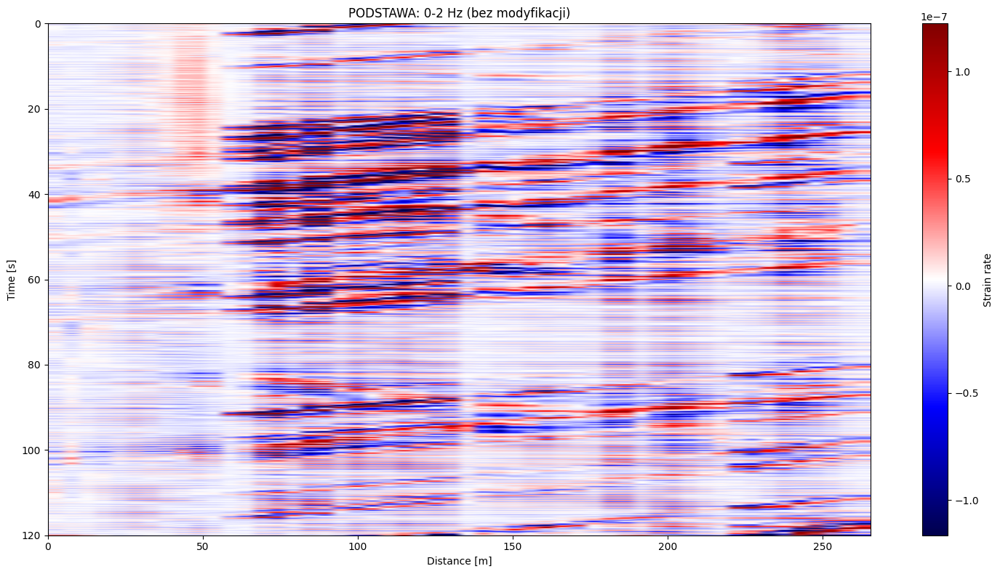


Krok 1: Odejmuję 50-500 Hz (mode: abs)
Filtrowanie z przedziałami: [(50, 500)]
  Processing channel 0/52
  Min: 1.40e-14
  Max: 4.37e-05
  Mean: 1.61e-07
  Std: 5.64e-07


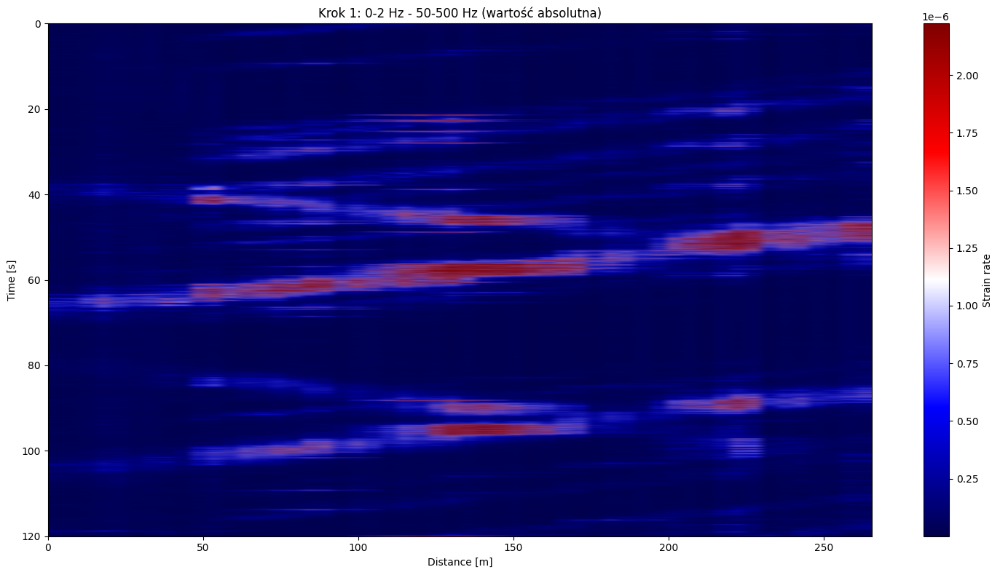

BINARY THRESHOLD FILTER
Threshold percentile: 90%
Mode: absolute
Keep original values: False
Threshold value (absolute): 2.966751e-07
Output: Binary (0 or 1)

Statistics:
  Samples above threshold: 390000 (10.00%)
  Samples below threshold: 3510000 (90.00%)



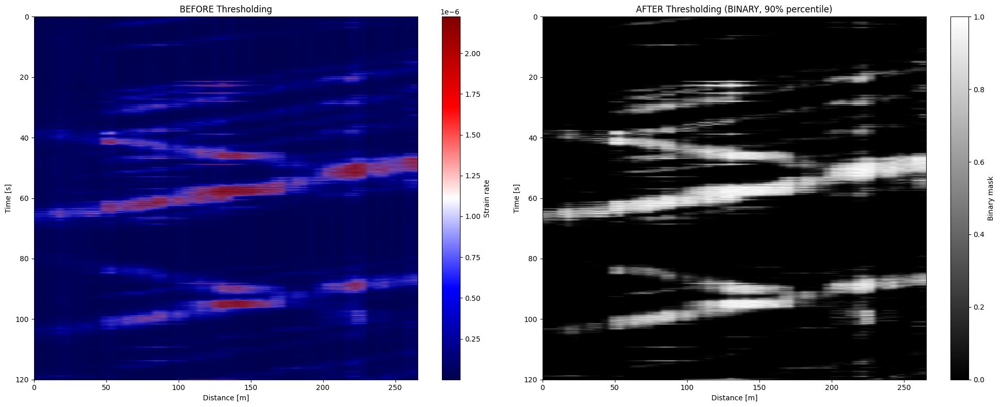

🚀 URUCHAMIANIE PIPELINE

[1/4] Temporal rescaling (100x)...
      Shape przed: (75000, 52)
      Shape po: (750, 52)
      dt: 0.001600s → 0.1600s

[2/4] Morphological closing (size=2)...
Morphological closing: size=2
  Before: 4042.0 pixels
  After:  5182.0 pixels

[3/4] Ekstrakcja komponentów (opening=0, min_area=15)...
      ✓ Znaleziono 21 komponentów
      ✓ Pojazdy: 14, Hałas: 7

[4/4] Generowanie wyników...

PODSUMOWANIE WYKRYWANIA
Wszystkie komponenty: 21
  └─ Strome (height > width): 14 - POJAZDY
  └─ Płaskie (height <= width): 7 - HAŁAS/ARTEFAKTY

────────────────────────────────────────────────────────────────────────────────
WYKRYTE POJAZDY:
────────────────────────────────────────────────────────────────────────────────
  ID  1:  52.2 km/h (14.51 m/s) | kąt=65.6° | area=  72 | 10×22px
  ID  3:  70.7 km/h (19.64 m/s) | kąt=58.4° | area= 141 | 16×26px
  ID  4:  97.2 km/h (27.01 m/s) | kąt=49.8° | area= 181 | 22×26px
  ID  5:  63.2 km/h (17.55 m/s) | kąt=61.2° | area=  74 | 1

C:\Users\jakub\AppData\Local\Temp\ipykernel_20056\4175220424.py:24: FutureWarning: `rectangle` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  selem = rectangle(closing_size, closing_size)


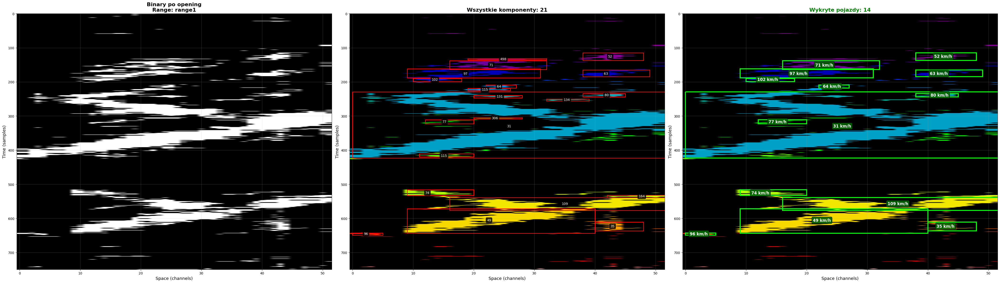


✅ PIPELINE ZAKOŃCZONY POMYŚLNIE


In [79]:
data_dict = get_range(range2[0], range2[1])
data = data_dict['data']
dt = data_dict['dt']
dx = data_dict['dx']

results = subtract_frequency_bands_step_by_step(data, dt, dx, 
    [(0, 2), (50, 500)],
    base_mode='brak', subtract_mode='abs')

# Weź ostatni wynik i zastosuj threshold
final_result = results[-1]
binary_result = binary_threshold_filter(final_result, dt, dx,
                                       threshold_percentile=90, 
                                       mode='absolute', 
                                       keep_values=False)  # False = BINARY!

# 2. Uruchom pipeline detekcji
detection_results = run_vehicle_detection_pipeline(
    binary_data=binary_result,      # <─── BINARY DATA Z TWOJEJ FILTRACJI
    dt=dt,                          # <─── Z get_range
    dx=dx,                          # <─── Z get_range
    rescale_factor=100,
    closing_size=2,
    opening_size=0,
    min_area=15,
    show_plots=True,
    verbose=True,
    range_name="range1"
)

In [80]:
from skimage.transform import probabilistic_hough_line, resize
from skimage.feature import canny
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict


def detect_lines_in_das(data, dt, dx, 
                        rescale_factor=100,
                        canny_sigma=1.0,
                        canny_low=0.1,
                        canny_high=0.3,
                        hough_threshold=50,
                        hough_line_length=20,
                        hough_line_gap=5,
                        min_angle=20,
                        max_angle=85,
                        show_plots=True):
    """
    Wykrywa linie w danych DAS używając Hough Transform.
    
    Parameters:
    -----------
    data : np.ndarray
        Dane wejściowe (time x channels) - mogą być surowe lub przefiltrowane
    dt : float
        Temporal sampling [s]
    dx : float
        Spatial sampling [m]
    rescale_factor : int
        Zmniejszenie w czasie (aspect ratio correction)
    canny_sigma : float
        Sigma dla Canny edge detection
    canny_low : float
        Dolny próg Canny (0-1)
    canny_high : float
        Górny próg Canny (0-1)
    hough_threshold : int
        Minimalna liczba punktów dla linii
    hough_line_length : int
        Minimalna długość linii
    hough_line_gap : int
        Maksymalna przerwa w linii
    min_angle : float
        Minimalny kąt linii (stopnie) - filtruje poziome
    max_angle : float
        Maksymalny kąt linii (stopnie) - filtruje pionowe
    show_plots : bool
        Czy pokazać wykresy
    
    Returns:
    --------
    dict : Wyniki detekcji
    """
    
    print("="*80)
    print("🔍 DETEKCJA LINII - HOUGH TRANSFORM")
    print("="*80)
    
    # ────────────────────────────────────────────────────────────────────────────
    # KROK 1: RESCALING (aspect ratio correction)
    # ────────────────────────────────────────────────────────────────────────────
    print(f"\n[1/5] Temporal rescaling ({rescale_factor}x)...")
    print(f"      Shape przed: {data.shape}")
    
    data_resized = resize(
        data,
        (data.shape[0] // rescale_factor, data.shape[1]),
        order=1,
        preserve_range=True,
        anti_aliasing=True
    )
    
    dt_rescaled = dt * rescale_factor
    
    print(f"      Shape po: {data_resized.shape}")
    print(f"      dt: {dt:.6f}s → {dt_rescaled:.4f}s")
    
    # ────────────────────────────────────────────────────────────────────────────
    # KROK 2: NORMALIZACJA
    # ────────────────────────────────────────────────────────────────────────────
    print(f"\n[2/5] Normalizacja danych...")
    
    # Normalizuj do [0, 1]
    data_norm = data_resized.copy()
    data_norm = (data_norm - np.min(data_norm)) / (np.max(data_norm) - np.min(data_norm) + 1e-10)
    
    print(f"      Min: {np.min(data_norm):.3f}, Max: {np.max(data_norm):.3f}")
    
    # ────────────────────────────────────────────────────────────────────────────
    # KROK 3: CANNY EDGE DETECTION
    # ────────────────────────────────────────────────────────────────────────────
    print(f"\n[3/5] Canny edge detection (sigma={canny_sigma})...")
    
    edges = canny(
        data_norm,
        sigma=canny_sigma,
        low_threshold=canny_low,
        high_threshold=canny_high
    )
    
    print(f"      Wykryte krawędzie: {np.sum(edges)} pikseli")
    
    # ────────────────────────────────────────────────────────────────────────────
    # KROK 4: PROBABILISTIC HOUGH TRANSFORM
    # ────────────────────────────────────────────────────────────────────────────
    print(f"\n[4/5] Probabilistic Hough Transform...")
    print(f"      threshold={hough_threshold}, line_length={hough_line_length}, line_gap={hough_line_gap}")
    
    lines = probabilistic_hough_line(
        edges,
        threshold=hough_threshold,
        line_length=hough_line_length,
        line_gap=hough_line_gap
    )
    
    print(f"      Wykryte linie: {len(lines)}")
    
    # ────────────────────────────────────────────────────────────────────────────
    # KROK 5: ANALIZA LINII - kąty i prędkości
    # ────────────────────────────────────────────────────────────────────────────
    print(f"\n[5/5] Analiza linii i obliczanie prędkości...")
    
    line_data = []
    
    for idx, line in enumerate(lines):
        (x0, y0), (x1, y1) = line
        
        # Kąt linii
        dx_line = x1 - x0
        dy_line = y1 - y0
        
        if dx_line == 0:
            angle = 90.0
        else:
            angle = np.degrees(np.arctan(np.abs(dy_line / dx_line)))
        
        # Filtruj linie po kącie
        if angle < min_angle or angle > max_angle:
            continue
        
        # Długość linii w pikselach
        length_px = np.sqrt(dx_line**2 + dy_line**2)
        
        # Prędkość: v = (dx * dx_spatial) / (dy * dt_temporal)
        if dy_line != 0:
            velocity = (abs(dx_line) * dx) / (abs(dy_line) * dt_rescaled)  # m/s
            velocity_kmh = velocity * 3.6
        else:
            velocity = 0
            velocity_kmh = 0
        
        line_data.append({
            'id': idx,
            'start': (x0, y0),
            'end': (x1, y1),
            'angle': angle,
            'length_px': length_px,
            'velocity': velocity,
            'velocity_kmh': velocity_kmh,
            'dx_line': dx_line,
            'dy_line': dy_line
        })
    
    print(f"      Linie po filtracji ({min_angle}°-{max_angle}°): {len(line_data)}")
    
    # Statystyki
    if len(line_data) > 0:
        velocities = [l['velocity_kmh'] for l in line_data]
        angles = [l['angle'] for l in line_data]
        
        print(f"\n{'─'*80}")
        print(f"STATYSTYKI WYKRYTYCH LINII:")
        print(f"{'─'*80}")
        print(f"  Liczba linii: {len(line_data)}")
        print(f"  Prędkości [km/h]:")
        print(f"    Min:     {min(velocities):6.1f}")
        print(f"    Max:     {max(velocities):6.1f}")
        print(f"    Średnia: {np.mean(velocities):6.1f}")
        print(f"    Mediana: {np.median(velocities):6.1f}")
        print(f"  Kąty [stopnie]:")
        print(f"    Min:     {min(angles):5.1f}°")
        print(f"    Max:     {max(angles):5.1f}°")
        print(f"    Średnia: {np.mean(angles):5.1f}°")
    
    # ────────────────────────────────────────────────────────────────────────────
    # WIZUALIZACJA
    # ────────────────────────────────────────────────────────────────────────────
    if show_plots:
        fig, axes = plt.subplots(2, 2, figsize=(20, 16))
        
        # Panel 1: Oryginalne dane (rescaled)
        im0 = axes[0, 0].imshow(data_resized, aspect='auto', cmap='seismic',
                               extent=[0, data_resized.shape[1]*dx, 
                                      data_resized.shape[0]*dt_rescaled, 0])
        axes[0, 0].set_title('Dane po rescaling', fontsize=14, fontweight='bold')
        axes[0, 0].set_xlabel('Distance [m]')
        axes[0, 0].set_ylabel('Time [s]')
        plt.colorbar(im0, ax=axes[0, 0])
        
        # Panel 2: Canny edges
        axes[0, 1].imshow(edges, aspect='auto', cmap='gray')
        axes[0, 1].set_title(f'Canny Edges (σ={canny_sigma})', fontsize=14, fontweight='bold')
        axes[0, 1].set_xlabel('Space [px]')
        axes[0, 1].set_ylabel('Time [px]')
        
        # Panel 3: Wykryte linie na danych
        im2 = axes[1, 0].imshow(data_resized, aspect='auto', cmap='gray',
                               extent=[0, data_resized.shape[1]*dx, 
                                      data_resized.shape[0]*dt_rescaled, 0])
        for line_info in line_data:
            (x0, y0), (x1, y1) = line_info['start'], line_info['end']
            # Konwersja z pikseli na metry/sekundy
            x0_m, x1_m = x0 * dx, x1 * dx
            y0_s, y1_s = y0 * dt_rescaled, y1 * dt_rescaled
            axes[1, 0].plot([x0_m, x1_m], [y0_s, y1_s], 'lime', linewidth=2, alpha=0.8)
        axes[1, 0].set_title(f'Wykryte linie: {len(line_data)}', fontsize=14, fontweight='bold')
        axes[1, 0].set_xlabel('Distance [m]')
        axes[1, 0].set_ylabel('Time [s]')
        axes[1, 0].set_xlim([0, data_resized.shape[1]*dx])
        axes[1, 0].set_ylim([data_resized.shape[0]*dt_rescaled, 0])
        
        # Panel 4: Tylko linie z prędkościami
        axes[1, 1].set_facecolor('black')
        for line_info in line_data:
            (x0, y0), (x1, y1) = line_info['start'], line_info['end']
            vel = line_info['velocity_kmh']
            # Kolor zależny od prędkości
            color = plt.cm.jet(vel / max([l['velocity_kmh'] for l in line_data]))
            axes[1, 1].plot([x0, x1], [y0, y1], color=color, linewidth=3, alpha=0.8)
            
            # Dodaj etykietę prędkości
            mid_x, mid_y = (x0 + x1) / 2, (y0 + y1) / 2
            axes[1, 1].text(mid_x, mid_y, f'{vel:.0f}', 
                           color='white', fontsize=8, ha='center',
                           bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))
        
        axes[1, 1].set_title(f'Linie z prędkościami [km/h]', fontsize=14, fontweight='bold')
        axes[1, 1].set_xlabel('Space [px]')
        axes[1, 1].set_ylabel('Time [px]')
        axes[1, 1].set_xlim([0, data_resized.shape[1]])
        axes[1, 1].set_ylim([data_resized.shape[0], 0])
        axes[1, 1].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
    
    # ────────────────────────────────────────────────────────────────────────────
    # ZWRÓĆ WYNIKI
    # ────────────────────────────────────────────────────────────────────────────
    results = {
        'lines': line_data,
        'edges': edges,
        'data_rescaled': data_resized,
        'metadata': {
            'n_lines': len(line_data),
            'dt': dt_rescaled,
            'dx': dx,
            'rescale_factor': rescale_factor,
            'original_shape': data.shape,
            'rescaled_shape': data_resized.shape
        }
    }
    
    print("\n" + "="*80)
    print("✅ DETEKCJA ZAKOŃCZONA")
    print("="*80)
    
    return results


print("✓ Funkcja detect_lines_in_das() załadowana")

✓ Funkcja detect_lines_in_das() załadowana



PODSTAWA: 0-2 Hz (mode: brak)
Filtrowanie z przedziałami: [(0, 2)]
  Processing channel 0/52


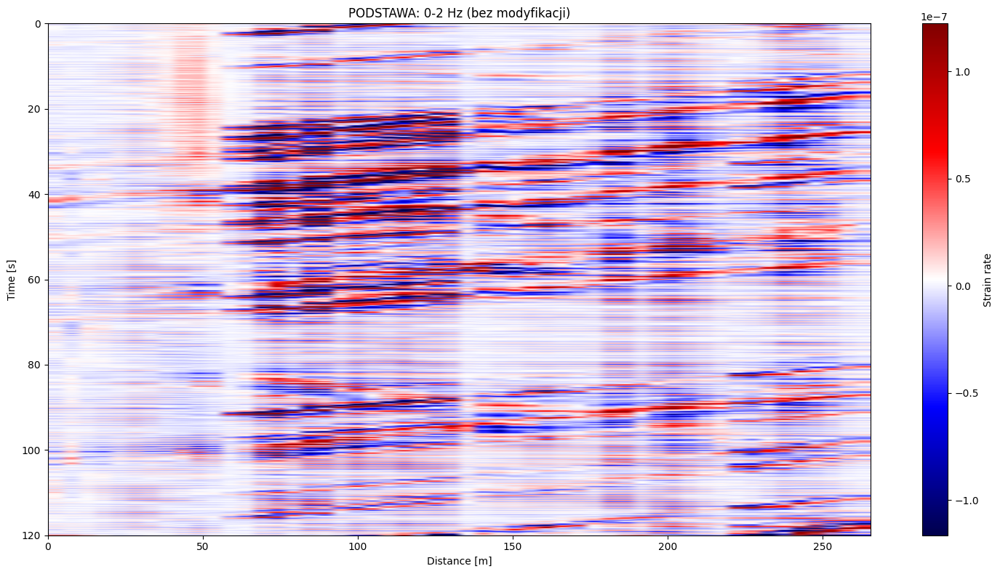


Krok 1: Odejmuję 50-500 Hz (mode: abs)
Filtrowanie z przedziałami: [(50, 500)]
  Processing channel 0/52
  Min: 1.40e-14
  Max: 4.37e-05
  Mean: 1.61e-07
  Std: 5.64e-07


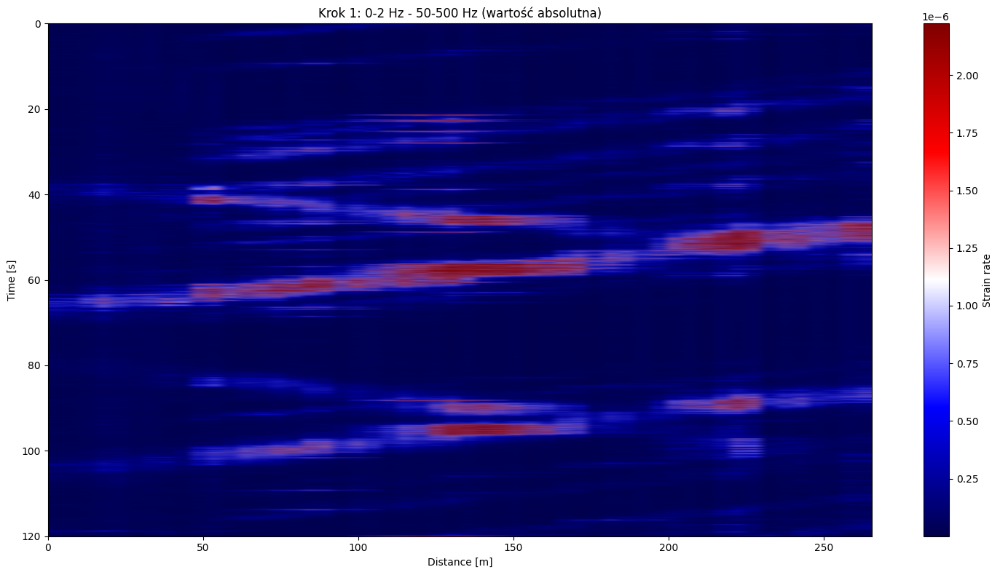

🔍 DETEKCJA LINII - HOUGH TRANSFORM

[1/5] Temporal rescaling (100x)...
      Shape przed: (75000, 52)
      Shape po: (750, 52)
      dt: 0.001600s → 0.1600s

[2/5] Normalizacja danych...
      Min: 0.000, Max: 1.000

[3/5] Canny edge detection (sigma=0.1)...
      Wykryte krawędzie: 2219 pikseli

[4/5] Probabilistic Hough Transform...
      threshold=10, line_length=15, line_gap=30
      Wykryte linie: 132

[5/5] Analiza linii i obliczanie prędkości...
      Linie po filtracji (10°-85°): 23

────────────────────────────────────────────────────────────────────────────────
STATYSTYKI WYKRYTYCH LINII:
────────────────────────────────────────────────────────────────────────────────
  Liczba linii: 23
  Prędkości [km/h]:
    Min:       10.4
    Max:       63.8
    Średnia:   28.9
    Mediana:   27.9
  Kąty [stopnie]:
    Min:      60.9°
    Max:      84.8°
    Średnia:  76.1°


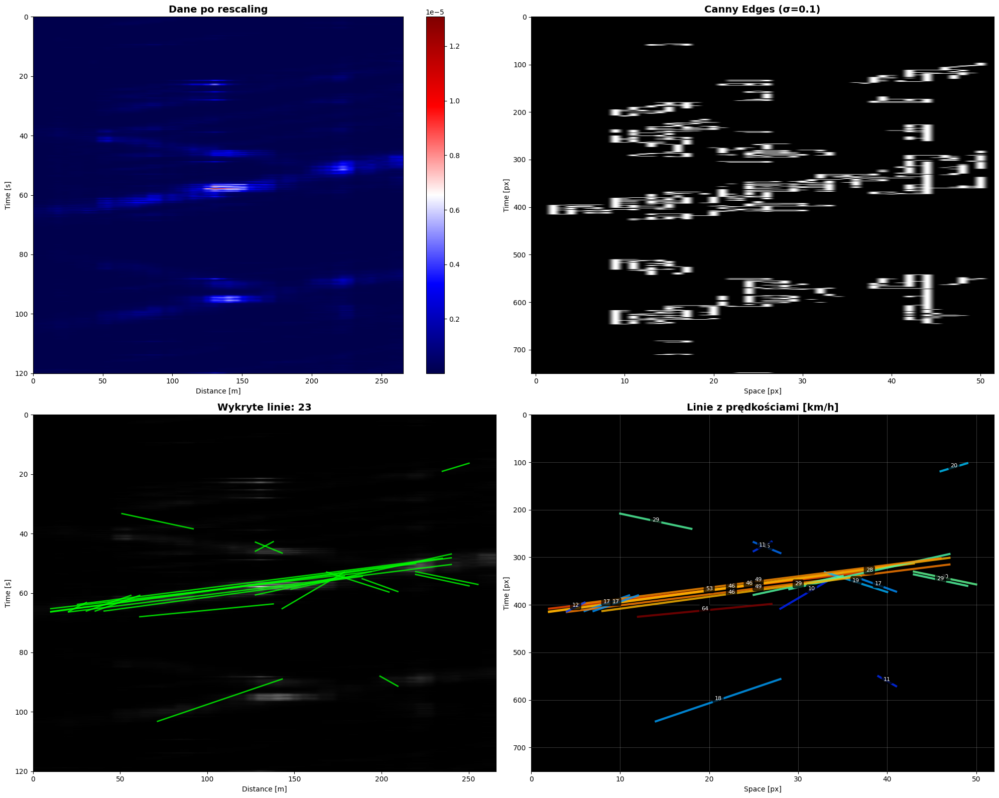


✅ DETEKCJA ZAKOŃCZONA
Wykryto 23 linii
Linia 6: 10.4 km/h, kąt=84.8°
Linia 28: 53.0 km/h, kąt=65.2°
Linia 38: 29.8 km/h, kąt=75.5°
Linia 40: 18.1 km/h, kąt=81.1°
Linia 41: 45.8 km/h, kąt=68.3°


In [89]:
data_dict = get_range(range2[0], range2[1])
data = data_dict['data']
dt = data_dict['dt']
dx = data_dict['dx']

filtered_results = subtract_frequency_bands_step_by_step(
    data_dict['data'], data_dict['dt'], data_dict['dx'],
    [(0, 2), (50, 500)],
    base_mode='brak', subtract_mode='abs'
)
final_filtered = filtered_results[-1]

results = detect_lines_in_das(
    data=final_filtered,
    dt=data_dict['dt'],
    dx=data_dict['dx'],
    rescale_factor=100,
    canny_sigma=0.1,
    canny_low=0.01,
    canny_high=0.1,
    hough_threshold=10,
    hough_line_length=15,
    hough_line_gap=30,
    min_angle=10,
    max_angle=85,
    show_plots=True
)

# Dostęp do wyników
print(f"Wykryto {len(results['lines'])} linii")
for line in results['lines'][:5]:  # Pierwsze 5
    print(f"Linia {line['id']}: {line['velocity_kmh']:.1f} km/h, kąt={line['angle']:.1f}°")

In [97]:
def detect_lines_in_das(data, dt, dx, 
                        rescale_factor=100,
                        apply_bias_square=False,
                        bias_value=0.0,
                        canny_sigma=1.0,
                        canny_low=0.1,
                        canny_high=0.3,
                        hough_threshold=50,
                        hough_line_length=20,
                        hough_line_gap=5,
                        min_angle=20,
                        max_angle=85,
                        show_plots=True):
    """
    Wykrywa linie w danych DAS używając Hough Transform.
    """
    
    print("="*80)
    print("🔍 DETEKCJA LINII - HOUGH TRANSFORM")
    print("="*80)
    
    # ────────────────────────────────────────────────────────────────────────────
    # KROK 1: TEMPORAL RESCALING - AVERAGING zamiast subsampling
    # ────────────────────────────────────────────────────────────────────────────
    print(f"\n[1/5] Temporal rescaling z averaging ({rescale_factor}x)...")
    print(f"      Shape przed: {data.shape}")
    
    # Obetnij dane żeby pasowały do rescale_factor
    new_time_size = (data.shape[0] // rescale_factor) * rescale_factor
    data_trimmed = data[:new_time_size, :]
    
    # Reshape i averaging
    data_resized = data_trimmed.reshape(
        data_trimmed.shape[0] // rescale_factor,  # nowe wymiary czasu
        rescale_factor,                            # ile próbek uśredniać
        data_trimmed.shape[1]                      # channels bez zmian
    ).mean(axis=1)  # uśrednij po osi rescale_factor
    
    dt_rescaled = dt * rescale_factor
    
    print(f"      Shape po: {data_resized.shape}")
    print(f"      dt: {dt:.6f}s → {dt_rescaled:.4f}s")
    print(f"      Metoda: AVERAGING (uśrednianie {rescale_factor} próbek)")
    
    # ────────────────────────────────────────────────────────────────────────────
    # KROK 2: BIAS + SQUARE (opcjonalne)
    # ────────────────────────────────────────────────────────────────────────────
    if apply_bias_square:
        print(f"\n[2/5] Transformacja (data + {bias_value})^2...")
        print(f"      Przed: min={np.min(data_resized):.3e}, max={np.max(data_resized):.3e}")
        data_transformed = (data_resized + bias_value) ** 2
        print(f"      Po:    min={np.min(data_transformed):.3e}, max={np.max(data_transformed):.3e}")
    else:
        print(f"\n[2/5] Pomijam bias+square...")
        data_transformed = data_resized.copy()
    
    # ────────────────────────────────────────────────────────────────────────────
    # KROK 3: NORMALIZACJA
    # ────────────────────────────────────────────────────────────────────────────
    print(f"\n[3/5] Normalizacja do [0,1]...")
    
    data_min = np.min(data_transformed)
    data_max = np.max(data_transformed)
    data_norm = (data_transformed - data_min) / (data_max - data_min + 1e-10)
    
    print(f"      Po normalizacji: min={np.min(data_norm):.3f}, max={np.max(data_norm):.3f}")
    
    # ────────────────────────────────────────────────────────────────────────────
    # KROK 4: CANNY EDGE DETECTION
    # ────────────────────────────────────────────────────────────────────────────
    print(f"\n[4/5] Canny edge detection...")
    print(f"      sigma={canny_sigma}, low={canny_low}, high={canny_high}")
    
    edges = canny(
        data_norm,
        sigma=canny_sigma,
        low_threshold=canny_low,
        high_threshold=canny_high
    )
    
    edge_pixels = np.sum(edges)
    edge_percent = (edge_pixels / edges.size) * 100
    print(f"      Wykryte krawędzie: {edge_pixels} pikseli ({edge_percent:.2f}%)")
    
    # ────────────────────────────────────────────────────────────────────────────
    # KROK 5: HOUGH TRANSFORM
    # ────────────────────────────────────────────────────────────────────────────
    print(f"\n[5/5] Probabilistic Hough Transform...")
    print(f"      threshold={hough_threshold}, line_length={hough_line_length}, line_gap={hough_line_gap}")
    
    lines = probabilistic_hough_line(
        edges,
        threshold=hough_threshold,
        line_length=hough_line_length,
        line_gap=hough_line_gap
    )
    
    print(f"      Wykryte linie (RAW): {len(lines)}")
    
    # ────────────────────────────────────────────────────────────────────────────
    # ANALIZA LINII
    # ────────────────────────────────────────────────────────────────────────────
    print(f"\n      Filtracja linii po kącie ({min_angle}° - {max_angle}°)...")
    
    line_data = []
    
    for idx, line in enumerate(lines):
        (x0, y0), (x1, y1) = line
        
        dx_line = x1 - x0
        dy_line = y1 - y0
        
        if dx_line == 0:
            angle = 90.0
        else:
            angle = np.degrees(np.arctan(np.abs(dy_line / dx_line)))
        
        if angle < min_angle or angle > max_angle:
            continue
        
        length_px = np.sqrt(dx_line**2 + dy_line**2)
        
        if dy_line != 0:
            velocity = (abs(dx_line) * dx) / (abs(dy_line) * dt_rescaled)
            velocity_kmh = velocity * 3.6
        else:
            velocity = 0
            velocity_kmh = 0
        
        line_data.append({
            'id': idx,
            'start': (x0, y0),
            'end': (x1, y1),
            'angle': angle,
            'length_px': length_px,
            'velocity': velocity,
            'velocity_kmh': velocity_kmh,
            'dx_line': dx_line,
            'dy_line': dy_line
        })
    
    print(f"      Linie po filtracji kąta: {len(line_data)}")
    
    # Statystyki
    if len(line_data) > 0:
        velocities = [l['velocity_kmh'] for l in line_data]
        angles = [l['angle'] for l in line_data]
        
        print(f"\n{'─'*80}")
        print(f"STATYSTYKI:")
        print(f"{'─'*80}")
        print(f"  Liczba linii: {len(line_data)}")
        print(f"  Prędkości [km/h]: min={min(velocities):.1f}, max={max(velocities):.1f}, śr={np.mean(velocities):.1f}")
        print(f"  Kąty [°]: min={min(angles):.1f}, max={max(angles):.1f}, śr={np.mean(angles):.1f}")
    else:
        print("\n⚠️  BRAK LINII! Zmniejsz hough_threshold / canny_low / canny_high")
    
    # ────────────────────────────────────────────────────────────────────────────
    # WIZUALIZACJA
    # ────────────────────────────────────────────────────────────────────────────
    if show_plots:
        n_panels = 3 if apply_bias_square else 2
        fig, axes = plt.subplots(2, n_panels, figsize=(10*n_panels, 16))
        
        col = 0
        
        # Panel: Oryginał po averaging
        im0 = axes[0, col].imshow(data_resized, aspect='auto', cmap='seismic',
                                 extent=[0, data_resized.shape[1]*dx, 
                                        data_resized.shape[0]*dt_rescaled, 0],
                                 vmin=np.percentile(data_resized, 1),
                                 vmax=np.percentile(data_resized, 99))
        axes[0, col].set_title(f'Po averaging ({rescale_factor}x)', fontsize=14, fontweight='bold')
        axes[0, col].set_xlabel('Distance [m]')
        axes[0, col].set_ylabel('Time [s]')
        plt.colorbar(im0, ax=axes[0, col])
        col += 1
        
        # Panel: Po bias+square (jeśli włączone)
        if apply_bias_square:
            im1 = axes[0, col].imshow(data_transformed, aspect='auto', cmap='hot',
                                     extent=[0, data_transformed.shape[1]*dx, 
                                            data_transformed.shape[0]*dt_rescaled, 0])
            axes[0, col].set_title(f'Po (data+{bias_value})^2', fontsize=14, fontweight='bold')
            axes[0, col].set_xlabel('Distance [m]')
            axes[0, col].set_ylabel('Time [s]')
            plt.colorbar(im1, ax=axes[0, col])
            col += 1
        
        # Panel: Canny edges
        axes[0, col].imshow(edges, aspect='auto', cmap='gray')
        axes[0, col].set_title(f'Canny (σ={canny_sigma})\n{edge_pixels} px ({edge_percent:.1f}%)', 
                              fontsize=14, fontweight='bold')
        axes[0, col].set_xlabel('Space [px]')
        axes[0, col].set_ylabel('Time [px]')
        
        # Panel dolny: Linie na danych
        col = 0
        im2 = axes[1, col].imshow(data_resized, aspect='auto', cmap='gray',
                                 extent=[0, data_resized.shape[1]*dx, 
                                        data_resized.shape[0]*dt_rescaled, 0],
                                 vmin=np.percentile(data_resized, 1),
                                 vmax=np.percentile(data_resized, 99))
        for line_info in line_data:
            (x0, y0), (x1, y1) = line_info['start'], line_info['end']
            x0_m, x1_m = x0 * dx, x1 * dx
            y0_s, y1_s = y0 * dt_rescaled, y1 * dt_rescaled
            axes[1, col].plot([x0_m, x1_m], [y0_s, y1_s], 'lime', linewidth=2, alpha=0.8)
        axes[1, col].set_title(f'Wykryte linie: {len(line_data)}', fontsize=14, fontweight='bold', color='green')
        axes[1, col].set_xlabel('Distance [m]')
        axes[1, col].set_ylabel('Time [s]')
        axes[1, col].set_xlim([0, data_resized.shape[1]*dx])
        axes[1, col].set_ylim([data_resized.shape[0]*dt_rescaled, 0])
        col += 1
        
        # Panel dolny: Prędkości
        axes[1, col].set_facecolor('black')
        if len(line_data) > 0:
            max_vel = max([l['velocity_kmh'] for l in line_data])
            for line_info in line_data:
                (x0, y0), (x1, y1) = line_info['start'], line_info['end']
                vel = line_info['velocity_kmh']
                color = plt.cm.jet(vel / max_vel)
                axes[1, col].plot([x0, x1], [y0, y1], color=color, linewidth=3, alpha=0.8)
                
                mid_x, mid_y = (x0 + x1) / 2, (y0 + y1) / 2
                axes[1, col].text(mid_x, mid_y, f'{vel:.0f}', 
                                 color='white', fontsize=9, ha='center',
                                 bbox=dict(boxstyle='round', facecolor='black', alpha=0.8))
        
        axes[1, col].set_title(f'Prędkości [km/h]', fontsize=14, fontweight='bold')
        axes[1, col].set_xlabel('Space [px]')
        axes[1, col].set_ylabel('Time [px]')
        axes[1, col].set_xlim([0, data_resized.shape[1]])
        axes[1, col].set_ylim([data_resized.shape[0], 0])
        axes[1, col].grid(True, alpha=0.3, color='white')
        
        # Ukryj dodatkowe panele jeśli nie ma bias+square
        if not apply_bias_square and n_panels == 3:
            axes[1, 2].axis('off')
        
        plt.tight_layout()
        plt.show()
    
    results = {
        'lines': line_data,
        'edges': edges,
        'data_resized': data_resized,
        'data_transformed': data_transformed,
        'data_normalized': data_norm,
        'metadata': {
            'n_lines': len(line_data),
            'dt': dt_rescaled,
            'dx': dx,
            'rescale_factor': rescale_factor,
            'original_shape': data.shape,
            'rescaled_shape': data_resized.shape,
            'edge_pixels': edge_pixels,
            'edge_percent': edge_percent
        }
    }
    
    print("\n" + "="*80)
    print("✅ DETEKCJA ZAKOŃCZONA")
    print("="*80)
    
    return results


print("✓ Funkcja detect_lines_in_das() z AVERAGING")

✓ Funkcja detect_lines_in_das() z AVERAGING



PODSTAWA: 0-2 Hz (mode: brak)
Filtrowanie z przedziałami: [(0, 2)]
  Processing channel 0/52


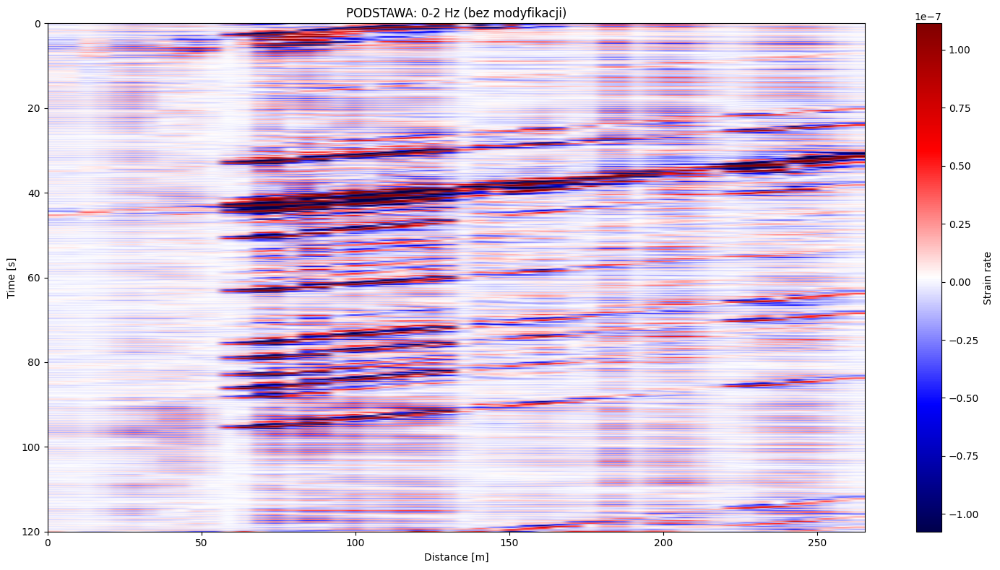


Krok 1: Odejmuję 50-500 Hz (mode: abs)
Filtrowanie z przedziałami: [(50, 500)]
  Processing channel 0/52
  Min: 4.00e-15
  Max: 3.35e-05
  Mean: 8.04e-08
  Std: 3.35e-07


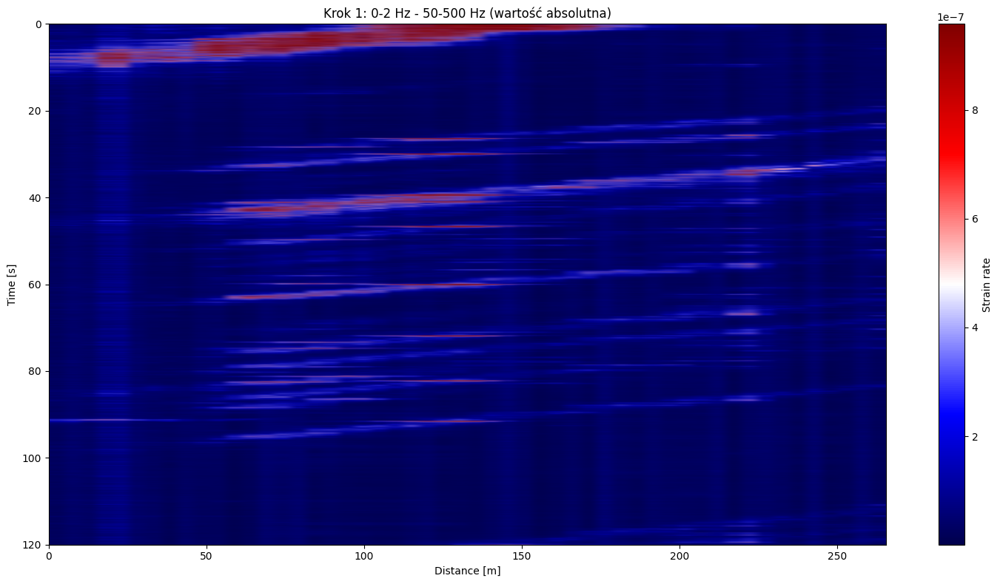

🔍 DETEKCJA LINII - HOUGH TRANSFORM

[1/5] Temporal rescaling z averaging (100x)...
      Shape przed: (75000, 52)
      Shape po: (750, 52)
      dt: 0.001600s → 0.1600s
      Metoda: AVERAGING (uśrednianie 100 próbek)

[2/5] Transformacja (data + 1)^2...
      Przed: min=8.027e-09, max=7.988e-06
      Po:    min=1.000e+00, max=1.000e+00

[3/5] Normalizacja do [0,1]...
      Po normalizacji: min=0.000, max=1.000

[4/5] Canny edge detection...
      sigma=0.05, low=0.05, high=0.1
      Wykryte krawędzie: 2003 pikseli (5.14%)

[5/5] Probabilistic Hough Transform...
      threshold=1, line_length=40, line_gap=60
      Wykryte linie (RAW): 108

      Filtracja linii po kącie (20° - 80°)...
      Linie po filtracji kąta: 21

────────────────────────────────────────────────────────────────────────────────
STATYSTYKI:
────────────────────────────────────────────────────────────────────────────────
  Liczba linii: 21
  Prędkości [km/h]: min=20.3, max=79.2, śr=46.9
  Kąty [°]: min=55.4, max=80.

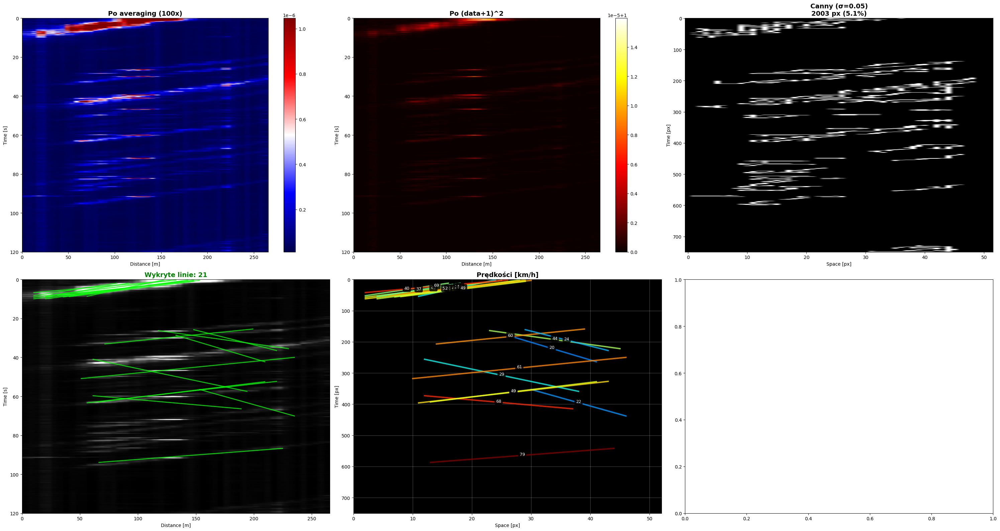


✅ DETEKCJA ZAKOŃCZONA
Wykryto 21 linii
Linia 5: 43.6 km/h, kąt=69.2°
Linia 8: 20.3 km/h, kąt=80.0°
Linia 23: 21.6 km/h, kąt=79.3°
Linia 25: 68.4 km/h, kąt=59.2°
Linia 26: 53.3 km/h, kąt=65.1°


In [113]:
data_dict = get_range(range3[0], range3[1])
data = data_dict['data']
dt = data_dict['dt']
dx = data_dict['dx']

filtered_results = subtract_frequency_bands_step_by_step(
    data_dict['data'], data_dict['dt'], data_dict['dx'],
    [(0, 2), (50, 500)],
    base_mode='brak', subtract_mode='abs'
)
final_filtered = filtered_results[-1]

results = detect_lines_in_das(
    data=final_filtered,
    dt=data_dict['dt'],
    dx=data_dict['dx'],
    rescale_factor=100,
    canny_sigma=0.05,
    canny_low=0.05,
    canny_high=0.10,
    apply_bias_square=True,    # <── WŁĄCZ
    bias_value=1,    
    hough_threshold=1,
    hough_line_length=40,
    hough_line_gap=60,
    min_angle=20,
    max_angle=80,
    show_plots=True
)

# Dostęp do wyników
print(f"Wykryto {len(results['lines'])} linii")
for line in results['lines'][:5]:  # Pierwsze 5
    print(f"Linia {line['id']}: {line['velocity_kmh']:.1f} km/h, kąt={line['angle']:.1f}°")